In [1]:
import logging
import os
import re
from typing import Optional, List

import scanpy as sc 
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
import pytorch_lightning as pl
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms.functional as TF
import wandb
from torch.utils.data import DataLoader, Dataset, SubsetRandomSampler, BatchSampler
from torchvision.transforms import ColorJitter, Normalize, RandomHorizontalFlip, RandomVerticalFlip, RandomAdjustSharpness
from torchvision.transforms.functional import resize
from timm import create_model
from einops import rearrange, reduce
from skimage.color import label2rgb
from skimage.measure import regionprops_table
from kmeans_pytorch import kmeans, kmeans_predict
from pytorch_lightning.callbacks import Callback

In [2]:
# !pip install kmeans-pytorch

In [3]:
wandb.login()

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: estorrs (tme-st). Use `wandb login --relogin` to force relogin


True

#### load datasets

In [4]:
fps = [os.path.join('../data/pdac', x) for x in os.listdir('../data/pdac')]
fps

['../data/pdac/HT270P1-S1H1U1',
 '../data/pdac/HT264P1-S1H2U1',
 '../data/pdac/HT424P1-H3A1U1',
 '../data/pdac/HT434P1-S1H3U1',
 '../data/pdac/HT427P1-S1H1U1',
 '../data/pdac/HT416P1-S1H1A1U1']

In [5]:
train_samples = [
    'HT270P1-S1H1U1',
#     'HT424P1-H3A1U1',
# # #     'HT434P1-S1H3U1',
#     'HT427P1-S1H1U1',
]

val_samples = [
    'HT264P1-S1H2U1',
#     'HT416P1-S1H1A1U1',
]

In [6]:
# def scale_expression_counts(a, scale=100.):
#     X = a.X.toarray()
# #     X = np.log1p(X.toarray())
# #      0-1
# #     X -= np.expand_dims(X.min(axis=0), 0)
# #     X /= np.expand_dims(X.max(axis=0), 0)
# #     X *= scale
# #     X = X.astype(np.int32).astype(np.float32)
#     a.X = X.astype(np.int32)
    
#     return a

In [7]:
a = sc.read_h5ad('../data/pdac/HT270P1-S1H1U1/adata.h5ad')
genes = a[:, a.var['highly_variable']].var.index.to_list()

In [8]:
sample_to_adata = {}
for fp in fps:
    s = fp.split('/')[-1]
    if s in train_samples or s in val_samples:
        a = sc.read_h5ad(os.path.join(fp, 'adata.h5ad'))
        a.X = a.layers['counts'].toarray().astype(np.int32) # using raw counts
        a = a[:, genes]
#         a = scale_expression_counts(a)
        sample_to_adata[s] = a

        print(s, a.shape)

HT270P1-S1H1U1 (3940, 2000)
HT264P1-S1H2U1 (3234, 2000)


In [9]:
sample_to_train_adata = {k:v for k, v in sample_to_adata.items() if k in train_samples}
sample_to_val_adata = {k:v for k, v in sample_to_adata.items() if k in val_samples}

In [10]:
a = next(iter(sample_to_train_adata.values()))
a

View of AnnData object with n_obs × n_vars = 3940 × 2000
    obs: 'in_tissue', 'array_row', 'array_col', 'clusters', 'spot_index'
    var: 'gene_ids', 'feature_types', 'genome', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'full_res_he', 'hvg', 'leiden', 'log1p', 'neighbors', 'nuclei_segmentation_1X_notrim', 'nuclei_segmentation_1X_trimmed', 'pca', 'region_annotation_labeled_img', 'region_annotation_labeled_img_2X_trimmed', 'region_annotation_labels', 'rescaled_he', 'rescaled_spot_masks', 'rescaled_spot_metadata', 'segmented_nuclei_coords', 'segmented_nuclei_coords_1X_notrim', 'segmented_nuclei_coords_1X_trimmed', 'spatial', 'trimmed', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial', 'spatial_16X_notrim', 'spatial_16X_trimmed', 'spatial_1X_notrim', 'spatial_1X_trimmed', 'spatial_2X_notrim', 'spatial_2X_trimmed', 'spatial_4X_notrim', 'spatial_4X_trimmed', 'spatial_8X_notrim', 'spatial_8X_trimmed', 'spatial_trimmed'
    varm: 'PCs'
    layers: 'counts'
    obsp: '

In [11]:
a.obs

,in_tissue,array_row,array_col,clusters,spot_index
AAACAACGAATAGTTC-1,1,0,16,17,1
AAACAAGTATCTCCCA-1,1,50,102,3,2
AAACAATCTACTAGCA-1,1,3,43,2,3
AAACACCAATAACTGC-1,1,59,19,5,4
AAACAGAGCGACTCCT-1,1,14,94,14,5
...,...,...,...,...,...
TTGTTGTGTGTCAAGA-1,1,31,77,17,3936
TTGTTTCACATCCAGG-1,1,58,42,5,3937
TTGTTTCATTAGTCTA-1,1,60,30,5,3938
TTGTTTCCATACAACT-1,1,45,27,1,3939


In [12]:
class HETransform(object):
    def __init__(self, p=.8, brightness=.1, contrast=.1, saturation=.1, hue=.1, sharpness=.3, normalize=True):
        self.brightness = brightness
        self.contrast = contrast
        self.saturation = saturation
        self.hue = hue
        self.sharpness = sharpness
        
        if normalize:
            self.normalize = Normalize((0.771, 0.651, 0.752), (0.229, 0.288, 0.224)) # from HT397B1-H2 ffpe H&E image
        else:
            self.normalize = nn.Identity()
 
        self.p = p
    
    def apply_color_transforms(self, x, brightness, contrast, saturation, hue, sharpness):
        x = TF.adjust_brightness(x, brightness)
        x = TF.adjust_contrast(x, contrast)
        x = TF.adjust_saturation(x, saturation)
        x = TF.adjust_hue(x, hue)
        x = TF.adjust_sharpness(x, sharpness)
        return x
        
    def __call__(self, he, mask, crop_rotation=None):
        """
        """
        if isinstance(he, torch.Tensor):
            hes = [he]
            masks = [mask]
            return_type = 'image'
        elif isinstance(he, dict):
            keys = list(he.keys())
            hes = [he[k] for k in keys]
            masks = [mask[k] for k in keys]
            return_type = 'dict'
        else:
            hes = he
            masks = mask
            return_type = 'list'
            
        squeeze = False
        if len(masks[0].shape) <= 2:
            masks = [x.unsqueeze(0) for x in masks]
            squeeze = True
                                
        # we apply transforms with probability p
        if torch.rand(size=(1,)) < self.p:
            deg = torch.randint(0, 360, (1,)).item()
            hes = [TF.rotate(x, deg) for x in hes]
            masks = [TF.rotate(x, deg) for x in masks]
            
            if crop_rotation is not None:
                hes = [TF.center_crop(x, crop_rotation) for x in hes]
                masks = [TF.center_crop(x, crop_rotation) for x in masks]
            
            brightness, contrast, saturation, hue, sharpness = (
                np.random.uniform(max(0, 1 - self.brightness), 1 + self.brightness, size=1)[0],
                np.random.uniform(max(0, 1 - self.contrast), 1 + self.contrast, size=1)[0],
                np.random.uniform(max(0, 1 - self.saturation), 1 + self.saturation, size=1)[0],
                np.random.uniform(-self.hue, self.hue, size=1)[0],
                np.random.uniform(max(0, 1 - self.sharpness), 1 + self.sharpness, size=1)[0],
            )
            # apply color jitter and sharpness
            hes = [self.apply_color_transforms(x, brightness, contrast, saturation, hue, sharpness)
                   for x in hes]
        else:
            if crop_rotation is not None:
                hes = [TF.center_crop(x, crop_rotation) for x in hes]
                masks = [TF.center_crop(x, crop_rotation) for x in masks]

        if squeeze:
            masks = [x.squeeze(0) for x in masks]
        
        # normalize he
        hes = [self.normalize(x) for x in hes]
                    
        if return_type == 'image':
            return hes[0], masks[0]
        elif return_type == 'dict':
            return {k:v for k, v in zip(keys, hes)}, {k:v for k, v in zip(keys, masks)}
        return hes, masks

In [13]:
def reflection_mosiac(x, border=256, dtype=torch.int32):
    max_r, max_c = x.shape[-2], x.shape[-1]
    if len(x.shape) == 3:
        mosaic = torch.zeros((x.shape[0], max_r + (border * 2), max_c + (border * 2))).to(dtype)
    else:
        mosaic = torch.zeros((max_r + (border * 2), max_c + (border * 2))).to(dtype)
    # make tiles
    top_left = TF.pad(x, padding=[border, border, 0, 0], padding_mode='reflect')
    top_right = TF.pad(x, padding=[0, border, border, 0], padding_mode='reflect')
    bottom_left = TF.pad(x, padding=[border, 0, 0, border], padding_mode='reflect')
    bottom_right = TF.pad(x, padding=[0, 0, border, border], padding_mode='reflect')
    
    if len(x.shape) == 3:
        mosaic[:, :max_r + border, :max_c + border] = top_left
        mosaic[:, :max_r + border, border:] = top_right
        mosaic[:, border:, :max_c + border] = bottom_left
        mosaic[:, border:, border:] = bottom_right
    else:
        mosaic[:max_r + border, :max_c + border] = top_left
        mosaic[:max_r + border, border:] = top_right
        mosaic[border:, :max_c + border] = bottom_left
        mosaic[border:, border:] = bottom_right
    
    return mosaic

In [14]:
def get_img_dicts(adata, keys=('2X', '8X'), border=256, mode='spot'):
    he_dict = {}
    for k, x in adata.uns['rescaled_he'].items():
        if re.findall(r'^[0-9]+X.*$', k) and 'trimmed' in k:
            scale = int(re.sub(r'^([0-9]+)X.*$', r'\1', k))
            x = torch.tensor(rearrange(x, 'h w c -> c h w')).to(torch.uint8)
            x = reflection_mosiac(x, border=border, dtype=torch.uint8)
            x = rearrange(x, 'c h w -> h w c').numpy().astype(np.uint8)
            he_dict[f'{scale}X'] = x
            
    mask_dict = {}
    for k, x in adata.uns['rescaled_spot_masks'].items():
        if re.findall(r'^[0-9]+X.*$', k) and 'trimmed' in k:
            scale = int(re.sub(r'^([0-9]+)X.*$', r'\1', k))
            x = torch.tensor(x.astype(np.int32))
            x = reflection_mosiac(x, border=border, dtype=torch.int32)
            x = x.numpy().astype(np.int32)
            mask_dict[f'{scale}X'] = x
            
    if mode == 'hex':
        mask_dict = {k:convert_spot_masks(adata, mask=v, key=f'{k}_trimmed', mode='hex')
                     for k, v in mask_dict.items()}
            
    he_dict = {k:v for k, v in he_dict.items() if k in keys}
    mask_dict = {k:v for k, v in mask_dict.items() if k in keys}
    
    return he_dict, mask_dict

In [156]:
def convert_rgb(img):
    if img.shape[-1] == 3:
        img = rearrange(img, 'h w c -> c h w')
        
    if not isinstance(img, torch.Tensor):
        img = torch.tensor(img)
        
    if img.dtype == torch.uint8:
        img = TF.convert_image_dtype(img, dtype=torch.float32)
    
    if img.max() > 1.:
        img -= img.min()
        img /= img.max()
    
    return img


def create_masks(labeled_mask, max_area, thresh=.5):
    voxel_idxs = torch.unique(labeled_mask)[1:].to(torch.long)
    masks = torch.zeros((len(voxel_idxs), labeled_mask.shape[0], labeled_mask.shape[1]), dtype=torch.bool)
    for i, l in enumerate(voxel_idxs):
        m = masks[i]
        m[labeled_mask==l] = 1
    
    keep = masks.sum(dim=(-1,-2)) / max_area > thresh
    
    if keep.sum() > 0:
        masks = masks[keep]
        voxel_idxs = voxel_idxs[keep]    
        return masks, voxel_idxs
    
    return None, None
        

class STDataset(Dataset):
    """ST Dataset"""
    def __init__(self, adata, he, he_context, labeled_mask, context_scaler, coordinate_key, anno_mask,
                 tile_size=512, rotation_scaler=2, he_transform=None,
                 border=512, max_jitter=0., min_voxel_fraction=.5, normalize=True, mask_size=(16, 16)):
        self.spot_ids, _ = zip(*sorted([(sid, sidx) for sid, sidx in zip(adata.obs.index, adata.obs['spot_index'])],
                                    key=lambda x: x[1]))
        self.spot_ids = np.asarray(self.spot_ids)
        self.rotation_scaler = rotation_scaler
        self.adata = adata[self.spot_ids]
        self.context_scaler = context_scaler
        self.he = convert_rgb(he)
        self.he_context = convert_rgb(he_context)
        self.labeled_mask = torch.tensor(labeled_mask, dtype=torch.int32) if not isinstance(labeled_mask, torch.Tensor) else labeled_mask
        self.anno_mask = torch.tensor(anno_mask, dtype=torch.int16) if not isinstance(anno_mask, torch.Tensor) else anno_mask
        self.mask_size = mask_size
        
        self.he_transform = he_transform
            
        if normalize:
            self.normalize = Normalize((0.771, 0.651, 0.752), (0.229, 0.288, 0.224)) # from HT397B1-H2 ffpe H&E image
        else:
            self.normalize = nn.Identity()
                
        self.exp = torch.tensor(adata.X, dtype=torch.int32)

        self.tile_size = tile_size 
        
        self.offset = int(self.tile_size * self.rotation_scaler // 2 + 1)
        self.border = border
        self.max_jitter = max_jitter
  
        self.pixel_coords = np.asarray([[int(r), int(c)] for c, r in self.adata.obsm[coordinate_key]])
    
        idxs = np.random.choice(np.arange(self.pixel_coords.shape[0]), size=100)
        max_spots = 0
        for i in idxs:
#             if i % 10 == 0:
#                 print(i)
            r, c = self.pixel_coords[i]
            r, c = r + self.border, c + self.border # adjust for reflection padding
            r, c = r - (self.offset // self.rotation_scaler), c - (self.offset // self.rotation_scaler) # adjust from center to top left
            lm = TF.crop(
                self.labeled_mask, top=r, left=c,
                height=self.tile_size, width=self.tile_size)
            m, _ = create_masks(lm, 1000, thresh=.0001)
            
            if m is not None:
                m = m[m.sum(dim=(-1, -2))>0]
                max_spots = max(max_spots, m.shape[0])
    
        self.max_spots = 2**int(np.log2(max_spots + 1) + 1)
        
        r, c = self.he.shape[1] // 2, self.he.shape[2] // 2
        tile = TF.crop(self.labeled_mask, top=r, left=c, height=self.tile_size, width=self.tile_size)
        self.max_voxel_area = np.max(
            regionprops_table(tile.detach().numpy(), properties=['label', 'area'])['area'])
        self.min_voxel_fraction = min_voxel_fraction
        
        # build fuzzy list of labels in each idx for downstream sampling purposes
        self.tile_labels = []
        for r, c in self.pixel_coords:
            r, c = r + self.border, c + self.border # adjust for reflection padding
            r, c = r - (self.offset // self.rotation_scaler), c - (self.offset // self.rotation_scaler) # adjust from center to top left
            tile = TF.crop(self.anno_mask, top=r, left=c, height=self.tile_size, width=self.tile_size)
            self.tile_labels.append(torch.unique(tile).tolist())
        
    def __len__(self):
        return len(self.pixel_coords)
    
    def __getitem__(self, idx):
        r, c = self.pixel_coords[idx]
        r = int(r + np.random.uniform(-self.max_jitter, self.max_jitter))
        c = int(c + np.random.uniform(-self.max_jitter, self.max_jitter))
        r_context, c_context = r // self.context_scaler, c // self.context_scaler
        
        # add offset and border
        r, c = r + self.border - self.offset, c + self.border - self.offset
        r_context, c_context = r_context + self.border - self.offset, c_context + self.border - self.offset
            
        he = TF.crop(
            self.he, top=r, left=c,
            height=self.tile_size * self.rotation_scaler, width=self.tile_size * self.rotation_scaler)
        he_context = TF.crop(
            self.he_context, top=r_context, left=c_context,
            height=self.tile_size * self.rotation_scaler, width=self.tile_size * self.rotation_scaler)
        
        # create mask
        lm = TF.crop(
            self.labeled_mask, top=r, left=c,
            height=self.tile_size * self.rotation_scaler, width=self.tile_size * self.rotation_scaler)
        anno_m = TF.crop(
            self.anno_mask, top=r, left=c,
            height=self.tile_size * self.rotation_scaler, width=self.tile_size * self.rotation_scaler)
        
        if self.he_transform is not None:
            (he, he_context), (lm, anno_m) = self.he_transform(
                [he, he_context], [lm, anno_m], crop_rotation=(self.tile_size, self.tile_size))
        
        m, v_idxs = create_masks(lm, self.max_voxel_area, thresh=self.min_voxel_fraction)
        
        masks = torch.zeros((self.max_spots, he.shape[1], he.shape[2]), dtype=torch.bool)
        voxel_idxs = torch.zeros((self.max_spots,), dtype=torch.int32)
        exp = torch.zeros((self.max_spots, self.exp.shape[1]), dtype=self.exp.dtype)
        if m is not None:
            idxs = v_idxs - 1
            masks[:len(idxs)] = m
            voxel_idxs[:len(idxs)] = v_idxs
            exp = torch.zeros((self.max_spots, self.exp.shape[1]), dtype=torch.float32)
            exp[:len(idxs)] = self.exp[idxs].to(torch.float32)
            exp *= (masks.sum(dim=(1,2)).unsqueeze(dim=-1) + 1.) / self.max_voxel_area
            exp = torch.round(exp).to(self.exp.dtype)
        
        # reduce mask to latent size of model
        masks = resize(masks, self.mask_size)
        y = resize(anno_m.unsqueeze(0), self.mask_size).squeeze()
        
        return {
            'he': self.normalize(he),
            'he_context': self.normalize(he_context),
            'he_orig': he,
            'masks': masks,
            'voxel_idxs': voxel_idxs,
            'exp': exp,
            'n_voxels': len(idxs) if torch.sum(voxel_idxs) > 0 else 0,
            'y': y
        }
        
        

In [ ]:
scales = [2, 8]
keys = [f'{s}X' for s in scales]
mode = 'spot'  
tile_size = 256 
mask_size = (16, 16)
spot_radius = next(iter(sample_to_adata.values())).uns['rescaled_spot_metadata'][keys[0] + '_trimmed']['spot_radius']
jitter = int(spot_radius * 2)
border = jitter * 4

train_he_transform = HETransform(p=.95, brightness=.1, contrast=.1, saturation=.1, hue=.1, normalize=False)
sample_to_train_ds = {}
for s in train_samples:
    print(s)
    a = sample_to_adata[s]

    he_dict, mask_dict = get_img_dicts(a, keys=keys, border=border, mode=mode)

    ds = STDataset(
        a, he_dict[keys[0]], he_dict[keys[1]], mask_dict[keys[0]], scales[1] // scales[0],
        'spatial_2X_trimmed', a.uns['region_annotation_labeled_img_2X_trimmed'],
        tile_size=tile_size, he_transform=train_he_transform,
        max_jitter=jitter, border=border, min_voxel_fraction=.25, normalize=True, mask_size=mask_size)
    
    sample_to_train_ds[s] = ds
    

HT270P1-S1H1U1


In [23]:
val_he_transform = HETransform(p=0., normalize=False)

sample_to_val_ds = {}
for s in val_samples:
    print(s)
    a = sample_to_adata[s]

    he_dict, mask_dict = get_img_dicts(a, keys=keys, border=border, mode=mode)

    ds = STDataset(
        a, he_dict[keys[0]], he_dict[keys[1]], mask_dict[keys[0]], scales[1] // scales[0],
        'spatial_2X_trimmed', a.uns['region_annotation_labeled_img_2X_trimmed'],
        tile_size=tile_size, he_transform=val_he_transform,
        max_jitter=0., border=border, min_voxel_fraction=.25, normalize=True, mask_size=mask_size)
    
    sample_to_val_ds[s] = ds
    

HT264P1-S1H2U1


In [110]:
class MultisampleSTDataset(Dataset):
    def __init__(self, ds_dict):
        super().__init__()
        self.samples = list(ds_dict.keys())
        self.ds_dict = ds_dict
        
        self.mapping = [(k, i, l) for k, ds in ds_dict.items() for i, l in zip(range(len(ds)), ds.tile_labels)]
        
    def get_labels(self, idx):
        return self.mapping[idx][2]
        
    def __len__(self):
        return len(self.mapping)

    def __getitem__(self, idx):
        k, i, _ = self.mapping[idx]
        
        d = self.ds_dict[k][i]

        return d

In [111]:
train_ds = MultisampleSTDataset(sample_to_train_ds)
len(train_ds)

3940

In [20]:
val_ds = MultisampleSTDataset(sample_to_val_ds)
len(val_ds)

3234

In [112]:
def get_partitions(ds):
    idxs = torch.arange(len(ds))
    classes = [ds.get_labels(i) for i in idxs]
    pool = sorted({l for ls in classes for l in ls})
    
    indices_list = [[] for _ in pool]
    for c, ls in zip(pool, indices_list):
        for idx in idxs:
            if c in classes[idx]:
                ls.append(idx.item())
        
    weights = [len(ls) for ls in indices_list]
    weights = [w / sum(weights) for w in weights]
    return weights, [torch.tensor(idxs) for idxs in indices_list]

In [113]:
from torch.utils.data.sampler import BatchSampler, Sampler
class PartitionRandomSampler(Sampler[int]):
    r"""Samples elements randomly from a given list of indices, without replacement.

    Args:
        indices (sequence): a sequence of indices
        generator (Generator): Generator used in sampling.
    """

    def __init__(self, indices_list, weights, batch_size=64, drop_last=False):
        assert len(indices_list)==len(weights)
        
        self.indices_list = indices_list
        self.weights = weights
        self.batch_size = batch_size
        self.drop_last = drop_last
        
        self.max_samples = max([len(idxs) for idxs in self.indices_list])
        self.n_batches = self.max_samples // self.batch_size
        if not drop_last and self.n_batches * self.batch_size != self.max_samples:
            self.n_batches += 1
            
        self.partition_sizes = [int(self.batch_size * w) for w in weights]
        # just add to background category to make even
        remainder = self.batch_size - sum(self.partition_sizes)
        self.partition_sizes[0] += self.partition_sizes[0] + remainder
        
    def __iter__(self):
        for i in range(self.n_batches):
            batch = [0] * self.batch_size
            current = 0
            for n, idxs in zip(self.partition_sizes, self.indices_list):
                batch[current:current + n] = idxs[torch.randperm(len(idxs))][:n]
                current += n
            yield batch
    
    def __len__(self):
        return self.n_batches

In [114]:
batch_size = 32

In [115]:
weights, idxs_list = get_partitions(train_ds)
# for now artificially set weights
weights = [.5, .25, .25]
sampler = PartitionRandomSampler(idxs_list, weights, batch_size=batch_size)
train_dl = DataLoader(train_ds, batch_sampler=sampler, pin_memory=True, num_workers=10)

In [25]:
weights, idxs_list = get_partitions(val_ds)
sampler = PartitionRandomSampler(idxs_list, weights, batch_size=batch_size)
val_dl = DataLoader(val_ds, batch_sampler=sampler, pin_memory=True, num_workers=10)

In [116]:
%%time
batch = next(iter(train_dl))

CPU times: user 14.5 s, sys: 1.83 s, total: 16.4 s
Wall time: 16.2 s


###### data inspection

In [117]:
def cte(padded_exp, masks, n_voxels):
    tile = torch.zeros((masks.shape[1], masks.shape[2], padded_exp.shape[1]))
    for exp, m in list(zip(padded_exp, masks))[:n_voxels]:
        tile[m==1] = exp.to(torch.float32)
    return tile

In [61]:
# for i in range(25):
#     print(i)
#     img = rearrange(train_ds[i]['he_orig'], 'c h w -> h w c')
#     img -= img.min()
#     img /= img.max()
#     plt.imshow(img)
#     plt.show()

In [118]:
# i = 166
# i = 66
# i = 22
i = 14
d = train_ds[i]

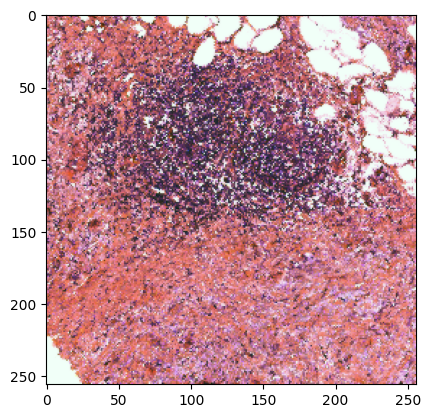

In [119]:
img = rearrange(d['he_context'], 'c h w -> h w c')
img -= img.min()
img /= img.max()
plt.imshow(img)

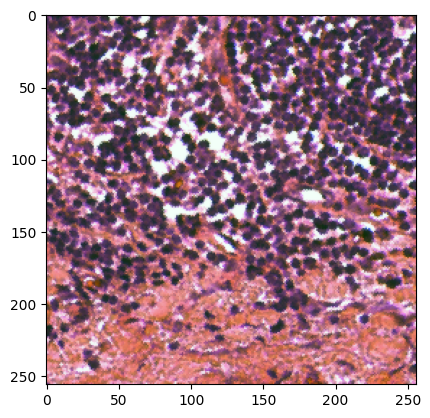

In [120]:
img = rearrange(d['he'], 'c h w -> h w c')
img -= img.min()
img /= img.max()
plt.imshow(img)

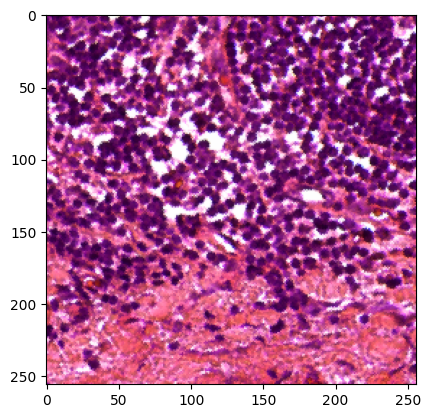

In [121]:
img = rearrange(d['he_orig'], 'c h w -> h w c')
plt.imshow(img)

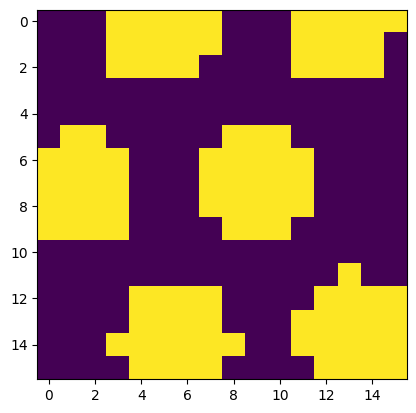

In [122]:
plt.imshow(torch.sum(d['masks'], dim=0))

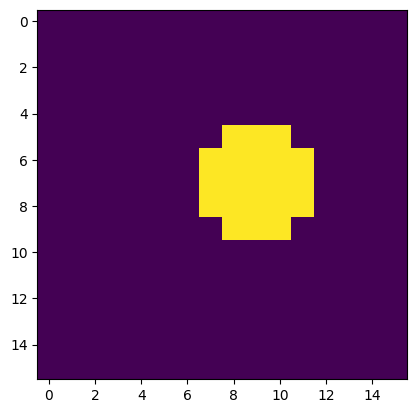

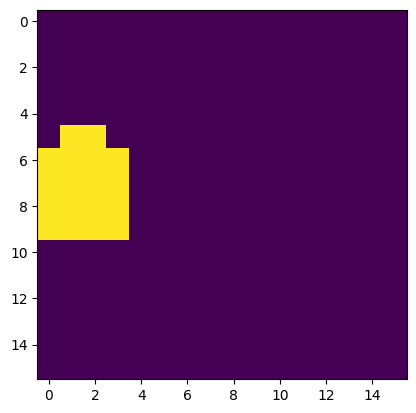

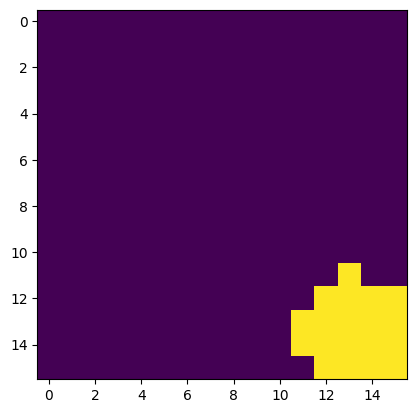

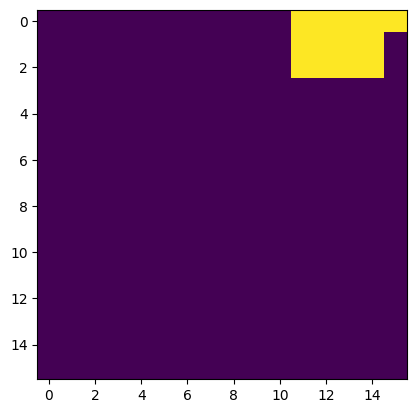

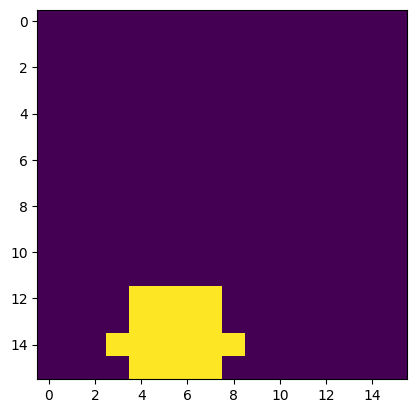

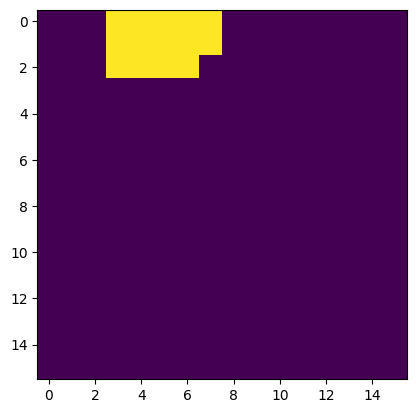

In [123]:
for j in range(d['n_voxels']):
    plt.imshow(d['masks'][j])
    plt.show()

In [124]:
d['masks'].shape

torch.Size([16, 16, 16])

In [125]:
torch.sum(d['masks'], dim=(-1, -2))

tensor([21, 18, 19, 13, 18, 14,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0])

In [126]:
a.var.index.to_list().index('KRT18')

1264

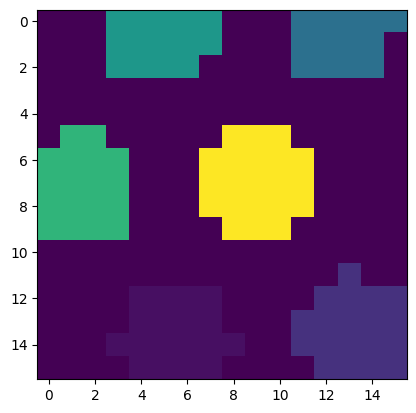

In [127]:
gene = 'IL7R'
recon = cte(d['exp'], d['masks'], d['n_voxels'])
plt.imshow(recon[:, :, a.var.index.to_list().index(gene)])

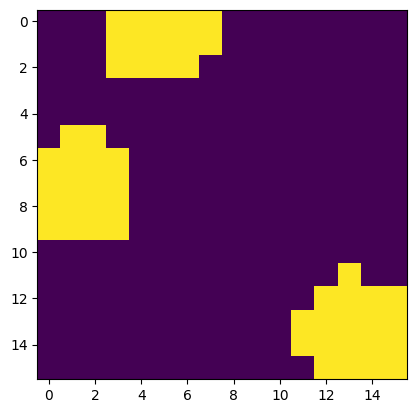

In [128]:
gene = 'KRT18'
recon = cte(d['exp'], d['masks'], d['n_voxels'])
plt.imshow(recon[:, :, a.var.index.to_list().index(gene)])

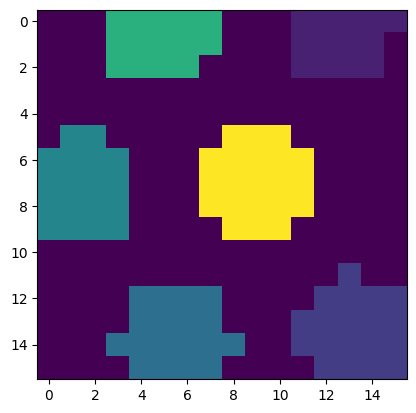

In [129]:
gene = 'PECAM1'
recon = cte(d['exp'], d['masks'], d['n_voxels'])
plt.imshow(recon[:, :, a.var.index.to_list().index(gene)])

In [130]:
d['exp']

tensor([[3, 0, 1,  ..., 7, 0, 0],
        [4, 0, 0,  ..., 7, 0, 0],
        [0, 0, 0,  ..., 2, 0, 0],
        ...,
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0]], dtype=torch.int32)

In [131]:
d['voxel_idxs']

tensor([  15,  357, 1384, 1915, 2230, 3510,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0], dtype=torch.int32)

In [132]:
a = next(iter(sample_to_train_adata.values()))
a

AnnData object with n_obs × n_vars = 3940 × 2000
    obs: 'in_tissue', 'array_row', 'array_col', 'clusters', 'spot_index', 'highlight'
    var: 'gene_ids', 'feature_types', 'genome', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'full_res_he', 'hvg', 'leiden', 'log1p', 'neighbors', 'nuclei_segmentation_1X_notrim', 'nuclei_segmentation_1X_trimmed', 'pca', 'region_annotation_labeled_img', 'region_annotation_labeled_img_2X_trimmed', 'region_annotation_labels', 'rescaled_he', 'rescaled_spot_masks', 'rescaled_spot_metadata', 'segmented_nuclei_coords', 'segmented_nuclei_coords_1X_notrim', 'segmented_nuclei_coords_1X_trimmed', 'spatial', 'trimmed', 'umap', 'highlight_colors'
    obsm: 'X_pca', 'X_umap', 'spatial', 'spatial_16X_notrim', 'spatial_16X_trimmed', 'spatial_1X_notrim', 'spatial_1X_trimmed', 'spatial_2X_notrim', 'spatial_2X_trimmed', 'spatial_4X_notrim', 'spatial_4X_trimmed', 'spatial_8X_notrim', 'spatial_8X_trimmed', 'spatial_trimmed'
    varm: 'PCs'
    lay

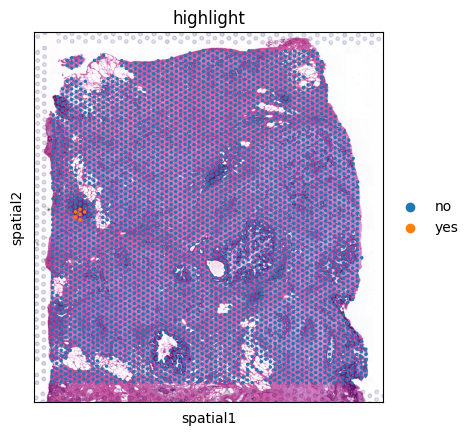

In [133]:
pool = set(d['voxel_idxs'][:d['n_voxels']].detach().numpy())
a.obs['highlight'] = ['yes' if i in pool else 'no'
                               for i in a.obs['spot_index']]
sc.pl.spatial(a, color='highlight')

In [149]:
a.uns['region_annotation_labels']

array(['Immune cells', 'Tumor'], dtype=object)

In [141]:
_, idxs_list = get_partitions(train_ds)
idxs_list[1:]

[tensor([  16,  739,  781, 1326, 1417, 1509, 1546, 1626, 1660, 1675, 1805, 1826,
         2244, 2288, 2392, 2459, 2481, 2489, 2499, 2580, 2587, 2637, 2705, 2825,
         2862, 2869, 3007, 3050, 3068, 3278, 3321, 3337, 3421, 3447, 3517, 3647,
         3726, 3866, 3878]),
 tensor([  37,   55,  100,  166,  181,  293,  357,  385,  442,  469,  491,  524,
          562,  588,  690,  720,  736,  738,  741,  744,  773,  802,  843,  920,
          949,  961, 1098, 1107, 1108, 1120, 1123, 1153, 1173, 1186, 1196, 1202,
         1232, 1267, 1321, 1369, 1484, 1491, 1530, 1601, 1693, 1739, 1820, 1825,
         1863, 1872, 1888, 1893, 1894, 1926, 1927, 1934, 1968, 2051, 2067, 2120,
         2124, 2128, 2161, 2176, 2195, 2222, 2262, 2302, 2337, 2342, 2403, 2406,
         2431, 2529, 2532, 2563, 2602, 2607, 2659, 2762, 2765, 2810, 2816, 2837,
         2887, 2915, 3000, 3015, 3017, 3061, 3070, 3076, 3166, 3167, 3199, 3201,
         3204, 3221, 3306, 3362, 3406, 3465, 3482, 3540, 3560, 3595, 3625, 3633,

In [150]:
d = train_ds[idxs_list[1][10]]

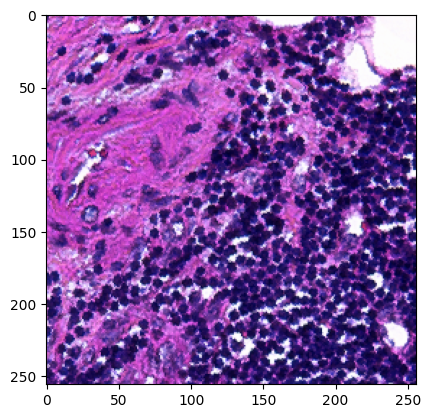

In [151]:
img = rearrange(d['he_orig'], 'c h w -> h w c')
plt.imshow(img)

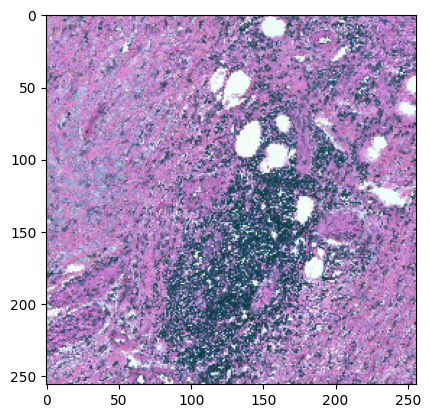

In [152]:
img = rearrange(d['he_context'], 'c h w -> h w c')
img -= img.min()
img /= img.max()
plt.imshow(img)

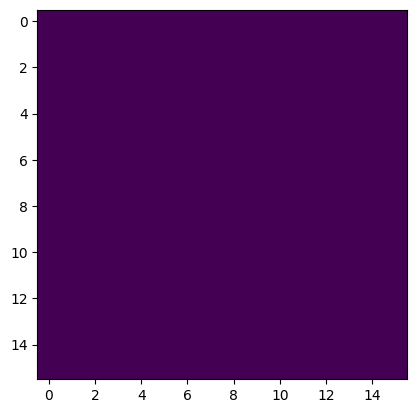

In [153]:
plt.imshow(d['y'])

In [154]:
d['y']

tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]], dtype=torch.int16)

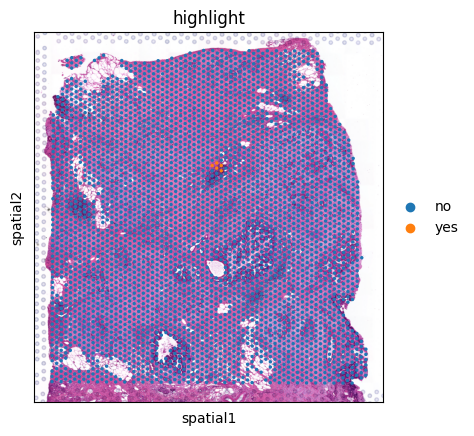

In [155]:
pool = set(d['voxel_idxs'][:d['n_voxels']].detach().numpy())
a.obs['highlight'] = ['yes' if i in pool else 'no'
                               for i in a.obs['spot_index']]
sc.pl.spatial(a, color='highlight')

#### model

In [ ]:
"""
modified from https://gist.github.com/rwightman/f8b24f4e6f5504aba03e999e02460d31
"""
class Unet(nn.Module):
    """Unet is a fully convolution neural network for image semantic segmentation
    Args:
        encoder_name: name of classification model (without last dense layers) used as feature
            extractor to build segmentation model.
        encoder_weights: one of ``None`` (random initialization), ``imagenet`` (pre-training on ImageNet).
        decoder_channels: list of numbers of ``Conv2D`` layer filters in decoder blocks
        decoder_use_batchnorm: if ``True``, ``BatchNormalisation`` layer between ``Conv2D`` and ``Activation`` layers
            is used.
        num_classes: a number of classes for output (output shape - ``(batch, classes, h, w)``).
        center: if ``True`` add ``Conv2dReLU`` block on encoder head
    NOTE: This is based off an old version of Unet in https://github.com/qubvel/segmentation_models.pytorch
    """

    def __init__(
            self,
            backbone='resnet34',
            backbone_kwargs=None,
            backbone_indices=None,
            decoder_use_batchnorm=True,
            decoder_channels=(256, 128, 64, 32, 16),
            in_chans=1,
            num_classes=5,
            center=False,
            norm_layer=nn.BatchNorm2d,
    ):
        super().__init__()
        backbone_kwargs = backbone_kwargs or {}
        # NOTE some models need different backbone indices specified based on the alignment of features
        # and some models won't have a full enough range of feature strides to work properly.
        encoder = create_model(
            backbone, features_only=True, out_indices=backbone_indices, in_chans=in_chans,
            pretrained=False, **backbone_kwargs)
        encoder_channels = encoder.feature_info.channels()[::-1]
        self.encoder = encoder

        if not decoder_use_batchnorm:
            norm_layer = None
        self.decoder = UnetDecoder(
            encoder_channels=encoder_channels,
            decoder_channels=decoder_channels,
            final_channels=num_classes,
            norm_layer=norm_layer,
            center=center,
        )

    def forward(self, x: torch.Tensor):
        x = self.encoder(x)
        x.reverse()  # torchscript doesn't work with [::-1]
        x = self.decoder(x)
        return x


class Conv2dBnAct(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, padding=0,
                 stride=1, act_layer=nn.ReLU, norm_layer=nn.BatchNorm2d):
        super().__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride=stride, padding=padding, bias=False)
        self.bn = norm_layer(out_channels)
        self.act = act_layer(inplace=True)

    def forward(self, x):
        x = self.conv(x)
        x = self.bn(x)
        x = self.act(x)
        return x


class DecoderBlock(nn.Module):
    def __init__(self, in_channels, out_channels, scale_factor=2.0, act_layer=nn.ReLU, norm_layer=nn.BatchNorm2d):
        super().__init__()
        conv_args = dict(kernel_size=3, padding=1, act_layer=act_layer)
        self.scale_factor = scale_factor
        if norm_layer is None:
            self.conv1 = Conv2dBnAct(in_channels, out_channels, **conv_args)
            self.conv2 = Conv2dBnAct(out_channels, out_channels,  **conv_args)
        else:
            self.conv1 = Conv2dBnAct(in_channels, out_channels, norm_layer=norm_layer, **conv_args)
            self.conv2 = Conv2dBnAct(out_channels, out_channels, norm_layer=norm_layer, **conv_args)

    def forward(self, x, skip: Optional[torch.Tensor] = None):
        if self.scale_factor != 1.0:
            x = F.interpolate(x, scale_factor=self.scale_factor, mode='nearest')
        if skip is not None:
            x = torch.cat([x, skip], dim=1)
        x = self.conv1(x)
        x = self.conv2(x)
        return x


class UnetDecoder(nn.Module):

    def __init__(
            self,
            encoder_channels,
            decoder_channels=(256, 128, 64, 32, 16),
            final_channels=1,
            norm_layer=nn.BatchNorm2d,
            center=False,
    ):
        super().__init__()

        if center:
            channels = encoder_channels[0]
            self.center = DecoderBlock(channels, channels, scale_factor=1.0, norm_layer=norm_layer)
        else:
            self.center = nn.Identity()

        in_channels = [in_chs + skip_chs for in_chs, skip_chs in zip(
            [encoder_channels[0]] + list(decoder_channels[:-1]),
            list(encoder_channels[1:]) + [0])]
        out_channels = decoder_channels

        self.blocks = nn.ModuleList()
        for in_chs, out_chs in zip(in_channels, out_channels):
            self.blocks.append(DecoderBlock(in_chs, out_chs, norm_layer=norm_layer))
        self.final_conv = nn.Conv2d(out_channels[-1], final_channels, kernel_size=(1, 1))

        self._init_weight()

    def _init_weight(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                torch.nn.init.kaiming_normal_(m.weight)
            elif isinstance(m, nn.BatchNorm2d):
                m.weight.data.fill_(1)
                m.bias.data.zero_()

    def forward(self, x: List[torch.Tensor]):
        encoder_head = x[0]
        skips = x[1:]
        x = self.center(encoder_head)
        for i, b in enumerate(self.blocks):
            skip = skips[i] if i < len(skips) else None
            x = b(x, skip)
        x = self.final_conv(x)
        return x

In [ ]:
def get_centroids(embs, labels, n_clusters, template=None):
    """
    embs - (b, d)
    labels - (b) , torch.LongTensor, 0-N
    n_clusters - N
    template - if no embeddings from that cluster are present in embs, then set to the value from template
    
    adapted from https://discuss.pytorch.org/t/groupby-aggregate-mean-in-pytorch/45335
    """
    missing = torch.tensor(list(set(np.arange(n_clusters)) - set(labels.cpu().numpy())), device=labels.device)
    if missing.shape[0]:
        zeros = torch.zeros(missing.shape[0], embs.shape[1], dtype=embs.dtype, device=embs.device)
        embs = torch.concat((embs, zeros), dim=0)
        labels = torch.concat((labels, missing), dim=0)
    
    labels = labels.view(labels.size(0), 1).expand(-1, embs.size(1))

    unique_labels, labels_count = labels.unique(dim=0, return_counts=True)

    x = torch.zeros_like(unique_labels, dtype=torch.float).scatter_add_(0, labels, embs)
    x = x / labels_count.float().unsqueeze(1)
    
    if template is not None:
        x[missing] = template[missing]
    
    return x # (N, d)


def select_triplets(labels):
    pool = torch.unique(labels)
    triplets = []
    for l in pool:
        neg_idxs = torch.arange(labels.shape[0])[labels!=l]
        pos_idxs = torch.arange(labels.shape[0])[labels==l]
        for i1 in pos_idxs:
            for i2 in neg_idxs:
                triplets.append(l, i1, i2) # anchor, positive, negative
    return torch.tensor(triplets)


In [165]:
class Model(nn.Module):
    def __init__(
        self,
        genes,
        n_clusters=20,
        in_dim=3,
        latent_dim=64,
#         decoder_channels=(128, 64, 32, 16, 8),
#         context_decoder_channels=(128, 64, 32, 16, 8),
        decoder_channels=(128, 64, 32),
        context_decoder_channels=(128, 64, 32),
        he_scaler=.1,
        kl_scaler=.001,
        exp_scaler=1.,
        unsupervised_cluster_scaler=.1,
        supervised_cluster_scaler=.1
    ):
        super().__init__()
        
        self.genes = genes
        self.n_genes = len(genes)
        self.latent_dim = latent_dim

        
        self.he_scaler = he_scaler
        self.kl_scaler = kl_scaler
        self.exp_scaler = exp_scaler
        self.unsupervised_cluster_scaler = unsupervised_cluster_scaler
        self.supervised_cluster_scaler = supervised_cluster_scaler
        
        self.unet = Unet(backbone='resnet34',
                         decoder_channels=decoder_channels,
                         in_chans=in_dim,
                         num_classes=self.latent_dim)
        
        self.context_unet = Unet(backbone='resnet34',
                         decoder_channels=context_decoder_channels,
                         in_chans=in_dim,
                         num_classes=self.latent_dim)
        
        self.post_unet_conv = nn.Conv2d(in_channels=self.latent_dim * 2, out_channels=self.latent_dim,
                                        kernel_size=1)

        # latent mu and var
        self.latent_mu = nn.Conv2d(in_channels=self.latent_dim, out_channels=self.latent_dim, kernel_size=1)
        self.latent_var = nn.Conv2d(in_channels=self.latent_dim, out_channels=self.latent_dim, kernel_size=1)
        self.latent_norm = nn.BatchNorm2d(self.latent_dim) # try changing momentum
        
        self.n_clusters = n_clusters
        self.centroids = None
        self.n_metagenes = n_clusters
        self.metagenes = torch.nn.Parameter(torch.rand(self.n_metagenes, self.n_genes))
        self.scale_factors = torch.nn.Parameter(torch.rand(self.n_genes))
        self.p = torch.nn.Parameter(torch.rand(self.n_genes))
        
        self.post_decode_he = torch.nn.Sequential( # we need to go up 4x
            DecoderBlock(self.latent_dim, self.latent_dim, scale_factor=2.0),
            DecoderBlock(self.latent_dim, self.latent_dim, scale_factor=2.0),
            DecoderBlock(self.latent_dim, self.latent_dim // 2, scale_factor=2.0),
            DecoderBlock(self.latent_dim // 2, self.latent_dim // 2, scale_factor=2.0),
            nn.Conv2d(self.latent_dim // 2, 3, kernel_size=(1, 1))
        )
        
        
        self.post_decode_cluster = torch.nn.Conv2d(self.latent_dim, self.n_metagenes, 1)
        
        self.he_loss = torch.nn.MSELoss()
        self.unsupervised_triplet_loss = torch.nn.TripletMarginLoss()
        self.supervised_triplet_loss = torch.nn.TripletMarginLoss()
        
    def _kl_divergence(self, z, mu, std):
        # lightning imp.
        # Monte carlo KL divergence
        p = torch.distributions.Normal(torch.zeros_like(mu), torch.ones_like(std))
        q = torch.distributions.Normal(mu, std)

        log_qzx = q.log_prob(z)
        log_pz = p.log_prob(z)

        kl = (log_qzx - log_pz)
        kl = kl.sum(-1)

        return kl
    
    def set_centroids(self, embs):
        labels, centroids = kmeans(X=embs, num_clusters=self.n_clusters, distance='euclidean', device=embs.device)
        self.centroids = torch.nn.Parameter(centroids)
        
#     def update_centroids(self, new_centroids, decay):
#         self.centroids.mul_(self.cluster_decay).add_(new_centroids, alpha=(1 - self.cluster_decay))
    def intracluster_distance(embs, labels):
        emb_centers = get_centroids(embs, labels, self.n_clusters, template=self.centroids)
        return F.pairwise_distance(self.centroids, emb_centers).sum()
    
    def cluster_loss(self, embs, labels_true):
        assert self.centroids is not None
        
        labels = kmeans_predict(embs, self.centroids, 'euclidean', device=embs.device)
        
        centroid_idxs, pos_idxs, neg_idxs = select_triplets(labels)
        unsupervised_loss = self.unsupervised_triplet_loss(
            self.centroids[centroid_idxs], embs[pos_idxs], embs[neg_idxs]
        )
        
        # supervised only on non-zero labels, zero is background
        ls = labels_true[labels_true!=0]
        if ls.shape[0] > 1:
            centroid_idxs, pos_idxs, neg_idxs = select_triplets(ls)
            supervised_loss = self.unsupervised_triplet_loss(
                self.centroids[centroid_idxs], embs[pos_idxs], embs[neg_idxs]
            )
        else: # if there is only one category in batch
            supervised_loss = 0.
        
        
#         adj_rand_score = adjusted_rand_score(labels[label_idxs], labels_true)
#         intercluster_dist = torch.cdist(self.centroids, self.centroids).sum()
#         intracluster_dist = self.intracluster_distance(embs, labels)
        
        return {
            'labels': labels,
            'supervised_cluster_loss': supervised_loss,
            'unsupervised_cluster_loss': unsupervised_loss,
            'cluster_loss': self.unsupervised_cluster_scaler * unsupervised_cluster_loss + self.supervised_cluster_scaler * unsupervised_loss
        }
        
        
    def calculate_loss(self, he_true, exp_true, labels_true, result):
        exp_loss = torch.mean(-result['nb'].log_prob(exp_true))
        
        kl_loss = torch.mean(self._kl_divergence(result['z'], result['z_mu'], result['z_std']))
        
        he_loss = torch.mean(self.he_loss(he_true, result['he']))
        
        overall_loss = exp_loss * self.exp_scaler + kl_loss * self.kl_scaler + he_loss * self.he_scaler

        
        # only do cluster loss if centroids are set
        if self.centroids is not None:
            cluster_loss = self.cluster_loss(
                rearrange(result['z'], 'b c h w -> (b h w) c'),
                rearrange(labels_true, 'b h w -> (b h w)'))
            overall_loss += cluster_loss['cluster_loss']
        
        to_return = {
            'overall_loss': overall_loss,
            'exp_loss': exp_loss,
            'kl_loss': kl_loss,
            'he_loss': he_loss
        }
        if self.centroids is not None:
            to_return.update(cluster_loss)
        
        return to_return

    
    def encode(self, x, x_context, use_means=False):
        x_encoded = self.unet(x)
        x_context_encoded = self.context_unet(x)
        
        x_encoded = torch.concat((x_encoded, x_context_encoded), dim=1)
        x_encoded = self.post_unet_conv(x_encoded)
        
        x_encoded = self.latent_norm(x_encoded)
        
        mu, log_var = self.latent_mu(x_encoded), self.latent_var(x_encoded)
        
        # sample z from parameterized distributions
        std = torch.exp(log_var / 2)
        q = torch.distributions.Normal(mu, std)
        # get our latent
        if use_means:
            z = mu
        else:
            z = q.rsample()

        return z, mu, std

    
    def reconstruct_expression(self, cluster_probs,
                               masks=None, voxel_idxs=None, reduce_to_voxel=True, gene_idxs=None):
        # cluster_probs (b n_clusters h w)
        if reduce_to_voxel:
            x = reduce_to_voxel_level(cluster_probs, masks) # (b, v, m)
        else:  
#             x = reduce(cluster_probs, 'b c (h1 h2) (w1 w2) -> b c h1 w1', 'mean',
#                        h2=reduction_scaler, w2=reduction_scaler)
            x = rearrange(x, 'b c h w -> b h w c')
            
        if gene_idxs is not None:
            metagenes = self.metagenes[:, gene_idxs]
            scale_factors = self.scale_factors[gene_idxs]
            p = self.p[gene_idxs]
        else:
            metagenes = self.metagenes
            scale_factors = self.scale_factors
            p = self.p
        
        r = x @ metagenes
        r = r * scale_factors
        r = F.softplus(r)
        
        p = torch.sigmoid(p)
        
        if reduce_to_voxel:
            p = rearrange(p, 'c -> 1 1 c')
            r = mask_nb_params(r, voxel_idxs)
        else:
            p = rearrange(p, 'c -> 1 1 1 c')
            
        r += .00000001
            
        nb = torch.distributions.NegativeBinomial(r, p)
        
        return {
            'r': r,
            'p': p,
            'exp': nb.mean,
            'nb': nb,
            'metagene_activity': x # (b v m)
        }
    
    def reconstruct_he(self, dec):
        he = self.post_decode_he(dec)
        return he
    
    def cluster_probs(self, z):
        x = self.post_decode_cluster(z)
        x = F.softmax(x, dim=1)
        return x

    def forward(self, x, x_context, masks=None, voxel_idxs=None, reduce_to_voxel=True,
                use_means=False, gene_idxs=None):
        z, z_mu, z_std = self.encode(x, x_context, use_means=use_means) # (b, c, h, w)

        he = self.reconstruct_he(z)
        
        cluster_probs = self.cluster_probs(z)
        
        exp_result = self.reconstruct_expression(cluster_probs, masks=masks, voxel_idxs=voxel_idxs,
                                                 reduce_to_voxel=reduce_to_voxel, gene_idxs=gene_idxs)
        
        result = {
            'z': z,
            'z_mu': z_mu,
            'z_std': z_std,
            'he': he,
            'cluster_probs': cluster_probs,
        }
        result.update(exp_result)

        return result

In [133]:
def reduce_to_voxel_level(x, masks):
    """
    x - (b, c, h, w)
    masks - (b, v, h, w)
    
    out - (b, v, c)
    """
    masks = masks.unsqueeze(dim=2) # (b, v, c, h, w)
    x = x.unsqueeze(dim=1).repeat(1, masks.shape[1], 1, 1, 1) # (b, v, c, h, w)
    x *= masks 
    return x.sum(dim=(-1, -2)) # (b, v, m)

def mask_nb_params(r, voxel_idxs):
    mask = torch.zeros_like(voxel_idxs, dtype=torch.bool)
    if r.is_cuda:
        mask = mask.cuda()
        
    mask[voxel_idxs == 0] = 1

    mask = mask.unsqueeze(dim=-1)
    masked_r = r.masked_fill(mask, 0.)
    
    return masked_r

def construct_tile_expression(padded_exp, masks, n_voxels, normalize=True):
    tile = torch.zeros((masks.shape[0], masks.shape[-2], masks.shape[-1], padded_exp.shape[-1]),
                       device=padded_exp.device)
    for b in range(tile.shape[0]):
        for exp, m in zip(padded_exp[b], masks[b]):
            tile[b, :, :][m==1] = exp.to(torch.float32)
            
    tile = rearrange(tile, 'b h w c -> b c h w')
    tile = tile.detach().cpu().numpy()
    
    tile /= np.expand_dims(tile.max(axis=(0, -2, -1)), (0, -2, -1))

    return rearrange(tile, 'b c h w -> b h w c')

In [134]:
def log_intermediates(logger, batch, result, plot_genes, model,
                      n_samples=8, identifier='train'):
    model_genes = np.asarray(model.genes)
    g2i = {g:i for i, g in enumerate(model_genes)}
    gene_idxs = np.asarray([g2i[g] for g in plot_genes])
    
    img = batch['he_context'][:n_samples].clone().detach().cpu()
    img -= img.min()
    img /= img.max()
    logger.log_image(
        key=f"{identifier}/he_context",
        images=[img],
        caption=[f'{identifier} he context']
    )
    
    img = batch['he'][:n_samples].clone().detach().cpu()
    img -= img.min()
    img /= img.max()
    logger.log_image(
        key=f"{identifier}/he_groundtruth",
        images=[img],
        caption=[f'{identifier} he tile 2x']
    )
    
    img = result['he'][:n_samples].clone().detach().cpu() # (b c h w)
    img -= img.min()
    img /= img.max()
    logger.log_image(
        key=f"{identifier}/he_reconstruction",
        images=[img],
        caption=[f'{identifier} he tile recon']
    )

    recon = construct_tile_expression(batch['exp'][:, :, gene_idxs], batch['masks'], batch['n_voxels'])
    recon = recon[:n_samples]
    recon = torch.tensor(rearrange(recon, 'b h w c -> c b 1 h w'))
    logger.log_image(
        key=f"{identifier}/exp_groundtruth",
        images=[img for img in recon],
        caption=[g for g in plot_genes]
    )

    recon = construct_tile_expression(result['exp'][:, :, gene_idxs], batch['masks'], batch['n_voxels'])
    recon = recon[:n_samples]
    recon = torch.tensor(rearrange(recon, 'b h w c -> c b 1 h w'))
    logger.log_image(
        key=f"{identifier}/exp_reconstruction",
        images=[img for img in recon],
        caption=[g for g in plot_genes]
    )
    

In [154]:
class ModelLightning(pl.LightningModule):
    def __init__(self, model, lr=1e-4, n_samples=8, plot_genes=['IL7R', 'KRT18', 'BGN', 'PECAM1', 'INS'],
                 log_every=10, set_centroids_epoch=10):
        super().__init__()
        
        self.model = model
        self.lr = lr
        self.plot_genes = plot_genes
        self.n_samples = n_samples
        self.log_every = log_every
        self.set_centroids_epoch = set_centroids_epoch
        
        self.save_hyperparameters(ignore=['model'])

    def training_step(self, batch, batch_idx):
        x, x_context, masks, voxel_idxs, exp, y = batch['he'], batch['he_context'], batch['masks'], batch['voxel_idxs'], batch['exp'], batch['y']
        result = self.model(x, x_context, masks=masks, voxel_idxs=voxel_idxs)
        losses = self.model.calculate_loss(x, exp, y, result)
        losses = {f'train/{k}':v for k, v in losses.items()}
        self.log_dict(losses, on_step=False, on_epoch=True, prog_bar=True)
        losses['loss'] = losses['train/overall_loss']
            
        # tack on result to output
        losses.update({'result': result})
        
        return losses
    
    def validation_step(self, batch, batch_idx):
        x, x_context, masks, voxel_idxs, exp, y = batch['he'], batch['he_context'], batch['masks'], batch['voxel_idxs'], batch['exp'], batch['y']
        result = self.model(x, x_context, masks=masks, voxel_idxs=voxel_idxs)
        losses = self.model.calculate_loss(x, exp, y, result)
        losses = {f'val/{k}':v for k, v in losses.items()}
        self.log_dict(losses, on_step=False, on_epoch=True, prog_bar=True)
        
        # tack on result to output
        losses.update({'result': result})
        
        return losses

    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self.parameters(), lr=self.lr)
        return optimizer
    
    
    

In [197]:
class LoggingCallback(Callback):
    def __init__(self):
        self.embs = None
    
    def on_train_batch_end(self, trainer, pl_module, outputs, batch, batch_idx):
        if trainer.current_epoch % pl_module.log_every == 0:
            x = reshape(outputs['result']['z'], 'b c h w -> (b h w) c').clone().detach()
            if batch_idx == 0:
                self.embs = x
            else:
                self.embs = torch.concat((self.embs, x), dim=0)

        if batch_idx == 0 and trainer.current_epoch % pl_module.log_every == 0:
            log_intermediates(pl_module.logger, batch, outputs['result'], pl_module.plot_genes,
                              pl_module.model, n_samples=pl_module.n_samples, identifier='train')
            
    def on_val_batch_end(self, trainer, pl_module, outputs, batch, batch_idx):
        if batch_idx == 0 and trainer.current_epoch % pl_module.log_every == 0:
            log_intermediates(pl_module.logger, batch, outputs['result'], pl_module.plot_genes,
                              pl_module.model, n_samples=pl_module.n_samples, identifier='val')
            
    def on_train_epoch_end(self, trainer, pl_module):
        if trainer.current_epoch % pl_module.log_every == 0:
            logger.log_table(key=f"train/embedding", columns=[i for i in range(self.embs.shape[1])],
                             data=self.embs.cpu().clone().detach().tolist())

class SetCentroidsCallback(Callback):
    def __init__(self):
        self.embs = None
    
    def on_train_batch_end(self, trainer, pl_module, outputs, batch, batch_idx):
        if trainer.current_epoch == pl_module.set_centroids_epoch:
            if batch_idx == 0:
                self.embs = outputs['result']['z']
            else:
                self.embs = torch.concat((self.embs, outputs['result']['z']), dim=0)
            
    def on_train_epoch_end(self, trainer, pl_module):
        if trainer.current_epoch == pl_module.set_centroids_epoch:
            pl_module.logger.log_text(f'setting centroids at epoch {trainer.current_epoch}')
            pl_module.model.set_centroids(self.embs)

In [203]:
x = torch.rand(32, 64, 16, 16)
x.reshape(-1, 64).shape

torch.Size([32768, 64])

###### test forwards

In [ ]:
batch = next(iter(train_dl))
x, b, masks, voxel_idxs, exp, exp_tiles = batch['he'], batch['b'], batch['masks'], batch['voxel_idxs'], batch['exp'], batch['exp_tiles']


In [ ]:
# autokl = AutoencoderKL(
#     train_adata.shape[1],
#     tile_resolution=32,
#     n_metagenes=20,
#     in_channels=3,
#     out_channels=64,
#     down_block_types=["DownEncoderBlock2D", "DownEncoderBlock2D", "DownEncoderBlock2D", "DownEncoderBlock2D"],
#     up_block_types=["UpDecoderBlock2D", "UpDecoderBlock2D", "UpDecoderBlock2D", "UpDecoderBlock2D"],
#     block_out_channels=[8, 16, 32, 64],
#     norm_num_groups=8,
#     latent_channels=4,
# )

In [ ]:
autokl = UnetBased(
    train_adata.var.index.to_list(),
    tile_resolution=32,
    n_metagenes=20,
    in_channels=3,
    out_channels=64,
    
)

In [ ]:
result = autokl(x)

In [ ]:
result.keys()

In [ ]:
result['exp'].shape

In [ ]:
plt.imshow(result['exp'][0, :, :, 5].detach().numpy())

In [ ]:
plt.imshow(result['metagene_activity'][0, :, :, 0].detach().numpy())

In [ ]:
losses = autokl.calculate_loss(x, exp_tiles, result)

In [ ]:
losses

#### training loop

In [137]:
project = 'new_model'
log_dir = '/scratch1/fs1/dinglab/estorrs/deep-spatial-genomics/logs'

In [138]:
from pytorch_lightning.loggers import WandbLogger
logger = WandbLogger(project=project, save_dir=log_dir)

In [201]:
# wandb.finish()

In [193]:
config = {
    'n_genes': next(iter(sample_to_train_adata.values())).shape[1],
    'genes': next(iter(sample_to_train_adata.values())).var.index.to_numpy(),
    'labels': next(iter(sample_to_train_ds.values())).idx_to_label,
    'plot_genes': ['IL7R', 'SPARC', 'KRT18', 'PECAM1', 'INS'],
    'n_covariates': 1,
    'n_clusters': 20,
    'latent_dim': 64,
    'latent_size': (16, 16),
#     'tile_resolution': 32,
    'he_scale': '2X',
    'he_context_scale': '8X',
    'encoder': {
        'model': 'unet',
        'in_dim': 3,
        'decoder_channels': (128, 64),
        'context_decoder_channels': (128, 64),
    },
    'scalers': {
        'exp_scaler': 1.,
        'kl_scaler': .0001,
        'he_scaler': .1,
        'supervised_cluster_scaler': .01,
        'unsupervised_cluster_scaler': .01,
    },
    'training': {
        'train_samples': list(sample_to_train_adata.keys()),
        'val_samples': list(sample_to_val_adata.keys()),
        'set_centroids_epoch': 2,
        'log_n_samples': 8,
        'max_epochs': 10,
        'check_val_every_n_epoch': 10,
        'log_every': 1,
        'accelerator': 'gpu',
        'devices': 1,
        'limit_train_batches': .1,
        'limit_val_batches': .1,
        'lr': 1e-5,
        'batch_size': batch_size,
        'precision': 32
    },
}
logger.experiment.config.update(config)

In [198]:
m = Model(
    config['genes'],
    n_clusters=config['n_clusters'],
    in_dim=config['encoder']['in_dim'],
    latent_dim=config['latent_dim'],
    decoder_channels=config['encoder']['decoder_channels'],
    context_decoder_channels=config['encoder']['context_decoder_channels'],
    he_scaler=config['scalers']['he_scaler'],
    kl_scaler=config['scalers']['kl_scaler'],
    exp_scaler=config['scalers']['exp_scaler'],
    supervised_cluster_scaler=config['scalers']['supervised_cluster_scaler'],
    unsupervised_cluster_scaler=config['scalers']['unsupervised_cluster_scaler'],
)
model = ModelLightning(m, lr=config['training']['lr'],
                       n_samples=config['training']['log_n_samples'],
                       log_every=config['training']['log_every'],
                       plot_genes=config['plot_genes'],
                       set_centroids_epoch=config['training']['set_centroids_epoch'])

In [199]:
trainer = pl.Trainer(
    callbacks=[LoggingCallback(), SetCentroidsCallback()],
    devices=config['training']['devices'],
    accelerator=config['training']['accelerator'],
    check_val_every_n_epoch=config['training']['check_val_every_n_epoch'],
    enable_checkpointing=False,
    limit_val_batches=config['training']['limit_val_batches'],
    limit_train_batches=config['training']['limit_train_batches'],
    max_epochs=config['training']['max_epochs'],
    precision=config['training']['precision'],
    logger=logger
)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


In [200]:
trainer.fit(model=model, train_dataloaders=train_dl, val_dataloaders=val_dl)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]

  | Name  | Type  | Params
--------------------------------
0 | model | Model | 45.2 M
--------------------------------
45.2 M    Trainable params
0         Non-trainable params
45.2 M    Total params
180.779   Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

/miniconda/lib/python3.9/site-packages/pytorch_lightning/trainer/trainer.py:653: UserWarning: Detected KeyboardInterrupt, attempting graceful shutdown...
  rank_zero_warn("Detected KeyboardInterrupt, attempting graceful shutdown...")


KeyboardInterrupt: 

In [36]:
!mkdir -p /scratch1/fs1/dinglab/estorrs/deep-spatial-genomics/runs/new_model_v1/

In [37]:
torch.save(model.state_dict(), '/scratch1/fs1/dinglab/estorrs/deep-spatial-genomics/runs/new_model_v1/model.pt')

In [20]:
m = Model(
    config['genes'],
    n_clusters=config['n_clusters'],
    in_dim=config['encoder']['in_channels'],
    latent_dim=config['latent_dim'],
    decoder_channels=config['encoder']['decoder_channels'],
    context_decoder_channels=config['encoder']['context_decoder_channels'],
    he_scaler=config['scalers']['he_scaler'],
    kl_scaler=config['scalers']['kl_scaler'],
    exp_scaler=config['scalers']['exp_scaler'],
    supervised_cluster_scaler=config['scalers']['supervised_cluster_scaler'],
    unsupervised_cluster_scaler=config['scalers']['unsupervised_cluster_scaler'],
)
model = ModelLightning(m, lr=config['training']['lr'],
                       n_samples=config['training']['log_n_samples'],
                       log_every=config['training']['log_every'],
                       plot_genes=config['plot_genes'],
                       set_centroids_epoch=config['training']['set_centroids_epoch'])
model.load_state_dict(torch.load('/scratch1/fs1/dinglab/estorrs/deep-spatial-genomics/runs/new_model_v1/model.pt'))

<All keys matched successfully>

In [21]:
sample_to_adata.keys()

dict_keys(['HT270P1-S1H1U1', 'HT264P1-S1H2U1', 'HT424P1-H3A1U1', 'HT427P1-S1H1U1', 'HT416P1-S1H1A1U1'])

In [55]:
# a = next(iter(sample_to_train_adata.values()))
# a = sample_to_val_adata['HT264P1-S1H2U1']
# a = sample_to_train_adata['HT270P1-S1H1U1']

s = 'HT416P1-S1H1A1U1'
a = sample_to_adata[s]
a

View of AnnData object with n_obs × n_vars = 2487 × 12
    obs: 'in_tissue', 'array_row', 'array_col', 'clusters', 'spot_index'
    var: 'gene_ids', 'feature_types', 'genome', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'full_res_he', 'hvg', 'leiden', 'log1p', 'neighbors', 'pca', 'rescaled_he', 'rescaled_spot_masks', 'rescaled_spot_metadata', 'spatial', 'trimmed', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial', 'spatial_16X_notrim', 'spatial_16X_trimmed', 'spatial_1X_notrim', 'spatial_1X_trimmed', 'spatial_2X_notrim', 'spatial_2X_trimmed', 'spatial_4X_notrim', 'spatial_4X_trimmed', 'spatial_8X_notrim', 'spatial_8X_trimmed', 'spatial_trimmed'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [56]:
# he = a.uns['rescaled_he']['2X_notrim']
he = a.uns['rescaled_he']['2X_trimmed']

he.shape

(7513, 7200, 3)

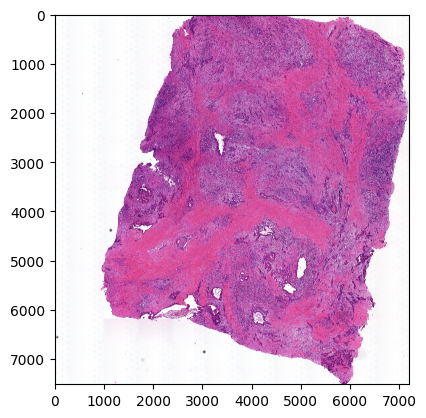

In [57]:
plt.imshow(he)

In [58]:
# context_he = a.uns['rescaled_he']['8X_notrim']
context_he = a.uns['rescaled_he']['8X_trimmed']
context_he.shape

(1878, 1800, 3)

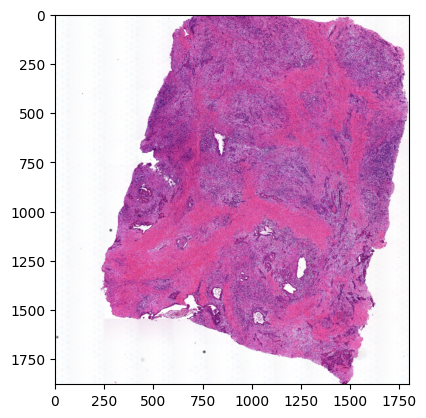

In [59]:
plt.imshow(context_he)

In [60]:
def reflection_mosiac(x, border=256):
    max_r, max_c = x.shape[-2], x.shape[-1]
    if len(x.shape) == 3:
        mosaic = torch.zeros((x.shape[0], max_r + (border * 2), max_c + (border * 2))).to(x.dtype)
    else:
        mosaic = torch.zeros((max_r + (border * 2), max_c + (border * 2))).to(x.dtype)
    
    # make tiles
    top_left = TF.pad(x, padding=[border, border, 0, 0], padding_mode='reflect')
    top_right = TF.pad(x, padding=[0, border, border, 0], padding_mode='reflect')
    bottom_left = TF.pad(x, padding=[border, 0, 0, border], padding_mode='reflect')
    bottom_right = TF.pad(x, padding=[0, 0, border, border], padding_mode='reflect')
    
    if len(x.shape) == 3:
        mosaic[:, :max_r + border, :max_c + border] = top_left
        mosaic[:, :max_r + border, border:] = top_right
        mosaic[:, border:, :max_c + border] = bottom_left
        mosaic[:, border:, border:] = bottom_right
    else:
        mosaic[:max_r + border, :max_c + border] = top_left
        mosaic[:max_r + border, border:] = top_right
        mosaic[border:, :max_c + border] = bottom_left
        mosaic[border:, border:] = bottom_right
    
    return mosaic

In [61]:
def tile_img(img, context_img, context_scale, tile_size=256, window_scale=2):
    context_img = reflection_mosiac(context_img, border=tile_size)
    
    n_rows = (img.shape[1] // tile_size) * window_scale + 1
    n_cols = (img.shape[2] // tile_size) * window_scale + 1
    
    tiles = torch.ones(n_rows * n_cols, img.shape[0], tile_size, tile_size, dtype=img.dtype)
    expanded = torch.ones(img.shape[0],
                          n_rows * tile_size // window_scale + tile_size,
                          n_cols * tile_size // window_scale + tile_size,
                          dtype=img.dtype)
    expanded[:, :img.shape[1], :img.shape[2]] = img
    
    context_tiles = torch.ones(n_rows * n_cols, img.shape[0], tile_size, tile_size, dtype=context_img.dtype)
    
    idx = 0
    top_left = []
    for r in range(n_rows):
        for c in range(n_cols):
            r1 = r * tile_size // window_scale
            c1 = c * tile_size // window_scale
            r2 = r1 + tile_size
            c2 = c1 + tile_size
            tiles[idx] = expanded[:, r1:r2, c1:c2]
            top_left.append((r, c))
            
            center_r = r1 + (tile_size / 2)
            center_c = c1 + (tile_size / 2)
            center_r = int(center_r / context_scale) 
            center_c = int(center_c / context_scale) 
            r1 = center_r - tile_size // 2 + tile_size
            c1 = center_c - tile_size // 2 + tile_size
            r2 = r1 + tile_size
            c2 = c1 + tile_size
            context_tiles[idx] = context_img[:, r1:r2, c1:c2]
            idx += 1
    return tiles, context_tiles, top_left

def get_tile(r, c, img, context_img, context_scale, tile_size=256, window_scale=2):
    r1 = r * tile_size // window_scale
    c1 = c * tile_size // window_scale
    r2 = r1 + tile_size
    c2 = c1 + tile_size
    tile = img[:, r1:r2, c1:c2]

    center_r = r1 + (tile_size / 2)
    center_c = c1 + (tile_size / 2)
    center_r = int(center_r / context_scale) 
    center_c = int(center_c / context_scale) 
    r1 = center_r - tile_size // 2 + tile_size
    c1 = center_c - tile_size // 2 + tile_size
    r2 = r1 + tile_size
    c2 = c1 + tile_size
    context_tile = context_img[:, r1:r2, c1:c2]
    
    return tile, context_tile

In [62]:
def prepare_img(img):
    if img.shape[0] != 3:
        img = rearrange(img, 'h w c -> c h w')
    if not isinstance(img, torch.Tensor):
        img = torch.tensor(img)
    if not img.dtype == torch.float32:
        img = TF.convert_image_dtype(img, dtype=torch.float32)
    
    return img 

class TiledHEDatasetV2(Dataset):
    def __init__(self, img, context_img, context_scale, normalize=True, tile_size=256, window_scale=2):
        super().__init__()
        
        img = prepare_img(img)
        context_img = prepare_img(context_img)

        self.context_scale = context_scale
        self.tile_size = tile_size
        self.window_scale = window_scale
        
        if normalize:
            self.normalize = Normalize((0.771, 0.651, 0.752), (0.229, 0.288, 0.224)) # from HT397B1-H2 ffpe H&E image
        else:
            self.normalize = nn.Identity()
            
        self.context_img = reflection_mosiac(context_img, border=tile_size)
    
        self.n_rows = (img.shape[1] // tile_size) * window_scale + 2
        self.n_cols = (img.shape[2] // tile_size) * window_scale + 2
        
        self.img = torch.ones(img.shape[0],
                          self.n_rows * tile_size // window_scale + tile_size,
                          self.n_cols * tile_size // window_scale + tile_size,
                          dtype=img.dtype)
        self.img[:, :img.shape[1], :img.shape[2]] = img
        
        self.idx_to_top_left = [(r, c)
                                for r in range(self.n_rows)
                                for c in range(self.n_cols)]
            
    def __len__(self):
        return len(self.idx_to_top_left)

    def __getitem__(self, idx):
        r, c = self.idx_to_top_left[idx]
        
        tile, context_tile = get_tile(r, c, self.img, self.context_img, self.context_scale,
                                     tile_size=self.tile_size, window_scale=self.window_scale)
        return {
            'he': self.normalize(tile),
            'context_he': self.normalize(context_tile),
            'top': r,
            'left': c
        }
    
class TiledHEDataset(Dataset):
    def __init__(self, img, context_img, context_scale, normalize=True, tile_size=256, window_scale=2):
        super().__init__()
        
        img = prepare_img(img)
        context_img = prepare_img(context_img)

        self.img = img
        self.context_img = context_img
        self.context_scale = context_scale
        self.tiles, self.context_tiles, self.idx_to_top_left = tile_img(img, context_img, context_scale,
                                                                        tile_size=tile_size, window_scale=window_scale)
        
        if normalize:
            self.normalize = Normalize((0.771, 0.651, 0.752), (0.229, 0.288, 0.224)) # from HT397B1-H2 ffpe H&E image
        else:
            self.normalize = nn.Identity()
            
    def max_r(self):
        rs, cs = zip(*self.idx_to_top_left)
        return np.max(rs)

    def max_c(self):
        rs, cs = zip(*self.idx_to_top_left)
        return np.max(cs)
        
    def __len__(self):
        return self.tiles.shape[0]

    def __getitem__(self, idx):
        tile, context_tile, (r, c) = self.tiles[idx], self.context_tiles[idx], self.idx_to_top_left[idx]
        return {
            'he': self.normalize(tile),
            'context_he': self.normalize(context_tile),
            'top': r,
            'left': c
        }

In [63]:
def add_tile(tile, new, r, c, max_r, max_c, window_scale=2,):
    ts = tile.shape[0] // window_scale
    normal_offset = ts // 2
    edge_offset = tile.shape[0] // 2
    rc, cc = r * ts + edge_offset, c * ts + edge_offset
    trc, tcc = edge_offset, edge_offset

    r1 = rc - normal_offset
    r2 = rc + normal_offset
    c1 = cc - normal_offset
    c2 = cc + normal_offset
    tr1 = trc - normal_offset
    tr2 = trc + normal_offset
    tc1 = tcc - normal_offset
    tc2 = tcc + normal_offset
    if r == 0:
        r1 = rc - edge_offset
        r2 = rc + normal_offset
        tr1 = trc - edge_offset
        tr2 = trc + normal_offset
    if c == 0:
        c1 = cc - edge_offset
        c2 = cc + normal_offset
        tc1 = tcc - edge_offset
        tc2 = tcc + normal_offset
    if r == max_r:
        r1 = rc - normal_offset
        r2 = rc + edge_offset
        tr1 = trc - normal_offset
        tr2 = trc + edge_offset
    if c == max_c:
        c1 = cc - normal_offset
        c2 = cc + edge_offset
        tc1 = tcc - normal_offset
        tc2 = tcc + edge_offset

    new[r1:r2, c1:c2] = tile[tr1:tr2, tc1:tc2]

def predict_he(img, context_img, context_scale, model,
               batch_size=8, num_workers=10,
               gene_idxs=None, keep=('he', 'exp', 'metagene_activity'),
               window_scale=2, rescale=False, resize=True, crop=True):
    orig_shape = img.shape
    ds = TiledHEDatasetV2(img, context_img, context_scale, window_scale=window_scale)
    dl = DataLoader(ds, batch_size=batch_size, shuffle=False, num_workers=num_workers)
    
    if gene_idxs is None:
        gene_idxs = np.arange(len(model.autokl.genes))
    
    with torch.no_grad():
        batch = next(iter(dl))
        he, he_context, top, left = batch['he'], batch['context_he'], batch['top'], batch['left']

        if next(iter(model.autokl.parameters())).is_cuda:
            he, he_context = he.cuda(), he_context.cuda()

        result = model.autokl(he, context_he, reduce_to_voxel=False, gene_idxs=gene_idxs)
        item = {k:v[0].detach().cpu()
               for k, v in result.items()
               if k in keep}
#         item['exp'] = item['exp'][:, :, gene_idxs]
        item['he'] = rearrange(item['he'], 'c h w -> h w c')
    max_r, max_c = ds.n_rows, ds.n_cols
    key_to_new = {k:torch.ones(tile.shape[0] * (max_r + 2) // window_scale,
                               tile.shape[1] * (max_c + 2) // window_scale,
                               tile.shape[2],
                               dtype=tile.dtype)
                 for k, tile in item.items()}
    
    model.eval()
    with torch.no_grad():
        for batch_idx, batch in enumerate(dl):
            if batch_idx % 20 == 0:
                print(batch_idx * batch_size)
            he, he_context, top, left = batch['he'], batch['context_he'], batch['top'], batch['left']

            if next(iter(model.autokl.parameters())).is_cuda:
                he, he_context = he.cuda(), he_context.cuda()

            result = model.autokl(he, context_he, reduce_to_voxel=False, gene_idxs=gene_idxs)

            for i in range(result['exp'].shape[0]):
                item = {k:v[i].detach().cpu()
                       for k, v in result.items()
                       if k in keep}
#                 item['exp'] = item['exp'][:, :, gene_idxs]
                item['he'] = rearrange(item['he'], 'c h w -> h w c')
                r, c = top[i], left[i]
                for k in keep:
                    tile = item[k]
                    add_tile(tile, key_to_new[k], r, c, max_r, max_c, window_scale=window_scale)
    
    if resize:
        for k, new in key_to_new.items():
            new = new[:orig_shape[0], :orig_shape[1]]
            key_to_new[k] = new
    
    if rescale:
        for k, new in key_to_new.items():
            if k == 'he':
                new -= new.min()
                new /= new.max()
            else:
                new -= new.amin(dim=(0, 1))
                new /= new.amax(dim=(0, 1))
            key_to_new[k] = new

    return key_to_new


In [64]:
model = model.cuda()

In [65]:
# show_genes = ['EPCAM', 'KRT18', 'IL7R', 'MS4A1', 'PECAM1', 'BGN', 'INS']
# show_genes = ['KRT18', 'IL7R', 'PECAM1', 'BGN']
show_genes = model.autokl.genes
gene_idxs = [i for i, g in enumerate(model.autokl.genes) if g in show_genes]
show_genes = model.autokl.genes[gene_idxs]
key_to_retiled = predict_he(he, context_he, 4, model, gene_idxs=gene_idxs, rescale=True, window_scale=2)

0
160
320
480
640
800
960
1120
1280
1440
1600
1760
1920
2080
2240
2400
2560
2720
2880
3040
3200
3360


In [38]:
he.shape

(7082, 6123, 3)

In [39]:
# for k, img in key_to_retiled.items():
#     key_to_retiled[k] = img[:he.shape[0], :he.shape[1]]

In [40]:
for k, img in key_to_retiled.items():
    print(k, img.shape, img.max(), img.amax(dim=(0, 1)))

he torch.Size([7082, 6123, 3]) tensor(1.) tensor([0.8725, 1.0000, 0.9187])
exp torch.Size([7082, 6123, 12]) tensor(1.) tensor([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])
metagene_activity torch.Size([7082, 6123, 10]) tensor(1.) tensor([1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])


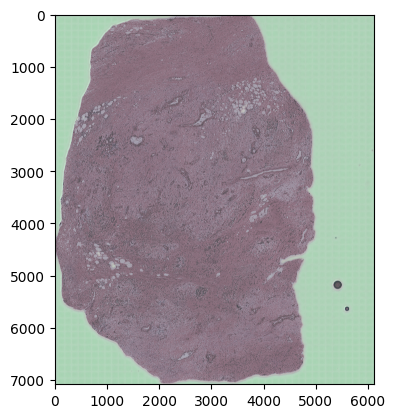

In [41]:
plt.imshow(key_to_retiled['he'])

In [42]:
# plt.imshow(he)

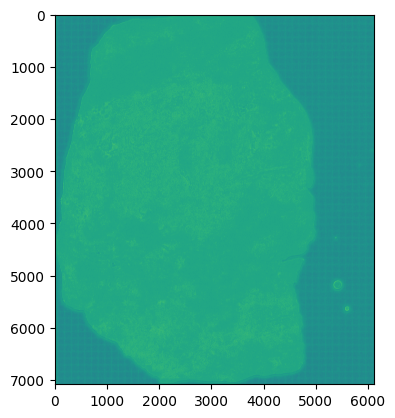

In [43]:
plt.imshow(key_to_retiled['exp'][:, :, 0])

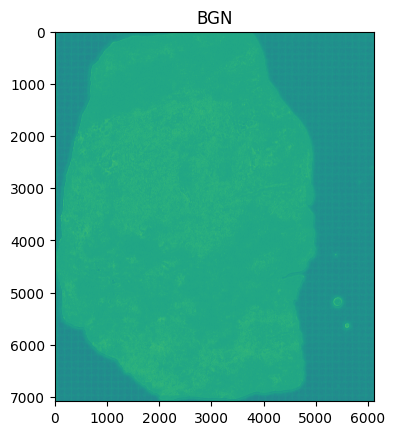

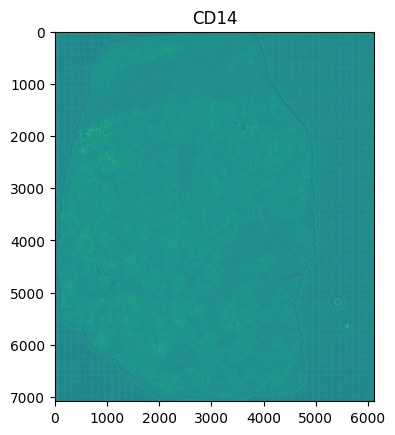

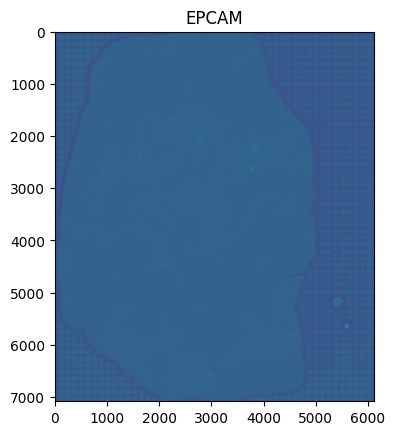

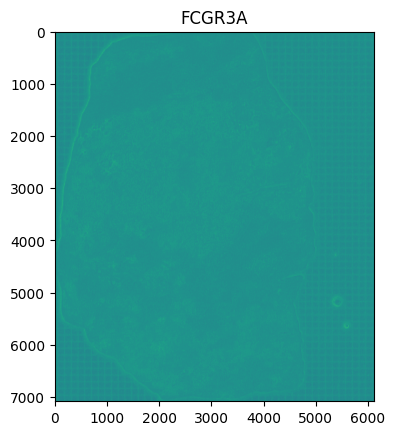

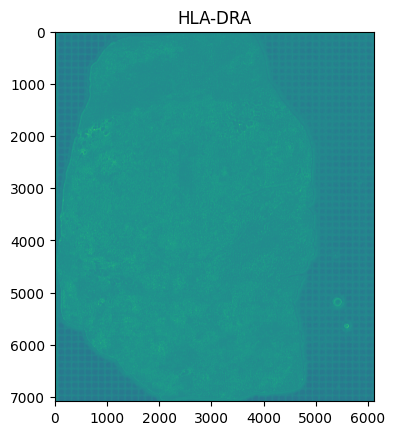

...

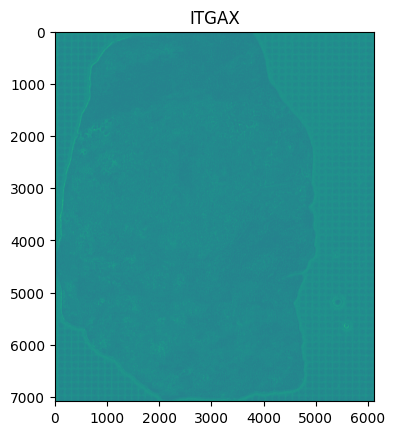

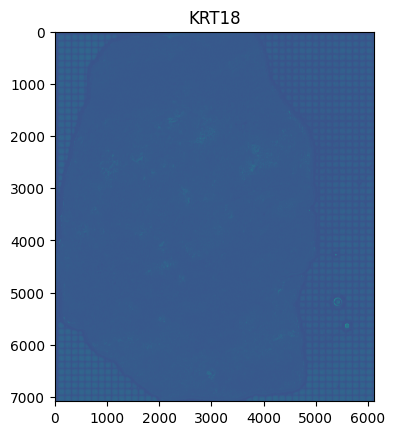

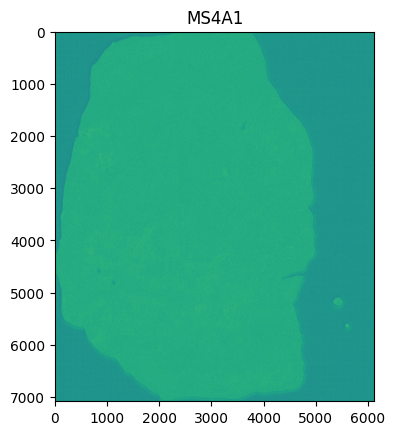

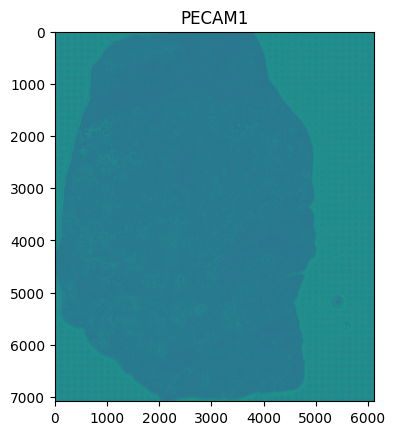

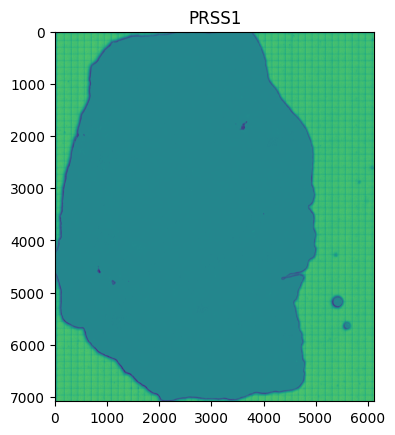

In [44]:
for i, g in enumerate(show_genes):
    plt.imshow(key_to_retiled['exp'][:, :, i])
    plt.title(g)
    plt.show()

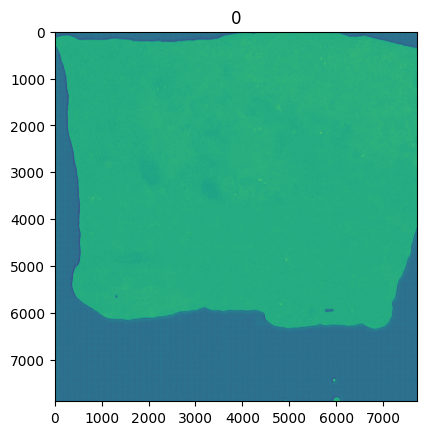

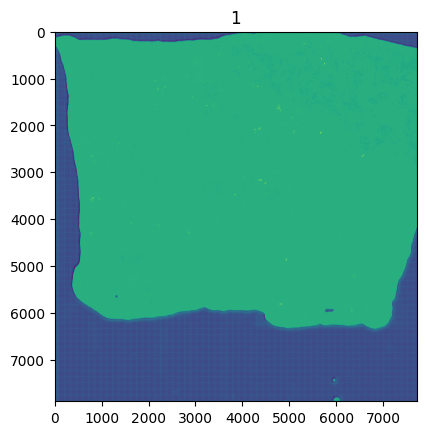

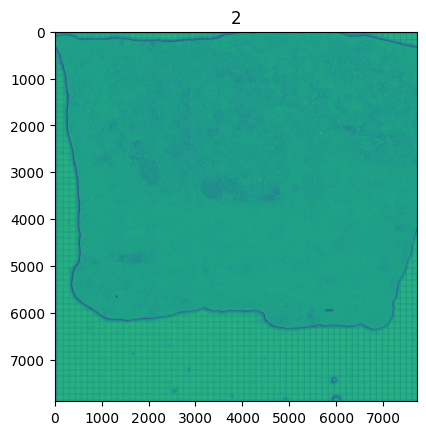

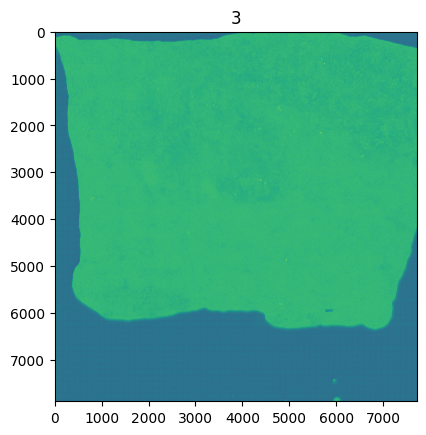

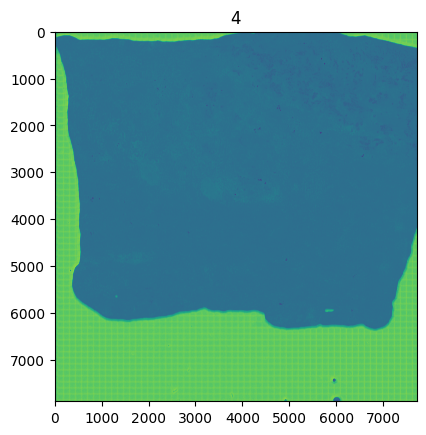

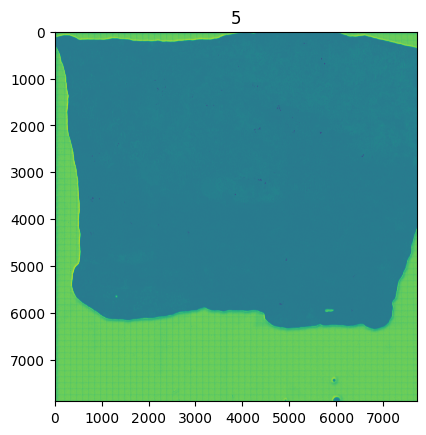

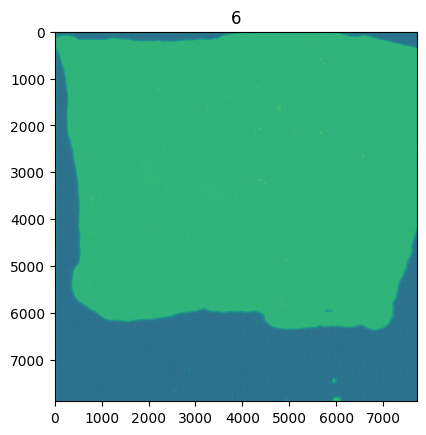

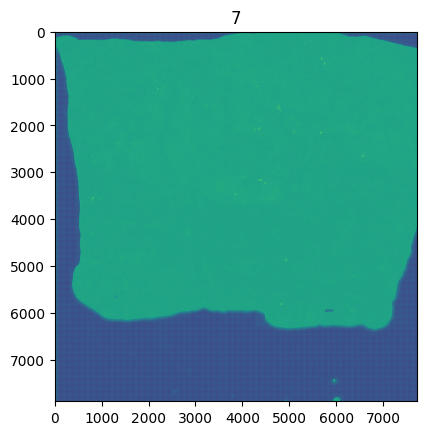

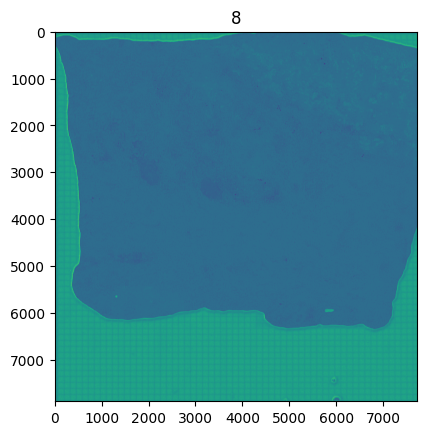

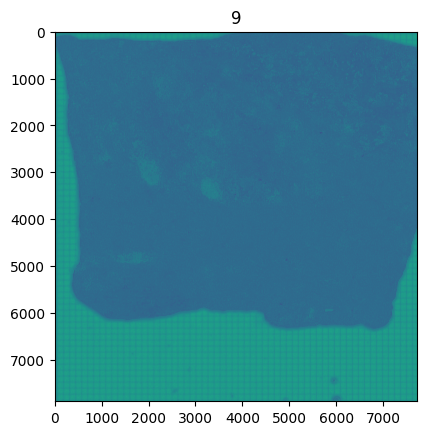

In [83]:
for i in range(key_to_retiled['metagene_activity'].shape[-1]):
    plt.imshow(key_to_retiled['metagene_activity'][:, :, i])
    plt.title(i)
    plt.show()

In [ ]:
# key_to_retiled = predict_he(he, context_he, 4, model, gene_idxs=gene_idxs,
#                             reduce_to_tile=False, batch_size=2, rescale=True, window_scale=2)

In [ ]:
# for i, g in enumerate(show_genes):
#     plt.imshow(np.log1p(key_to_retiled['exp'][:, :, i]))
#     plt.title(g)
#     plt.show()

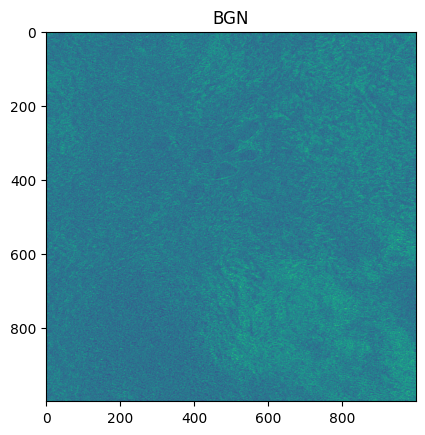

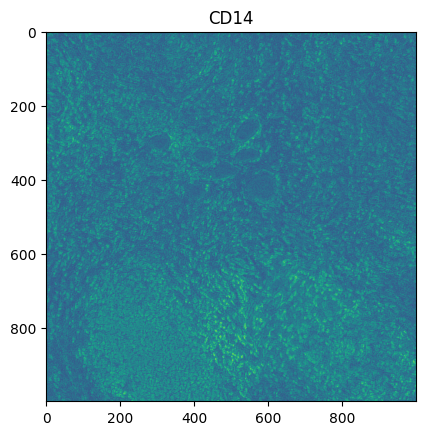

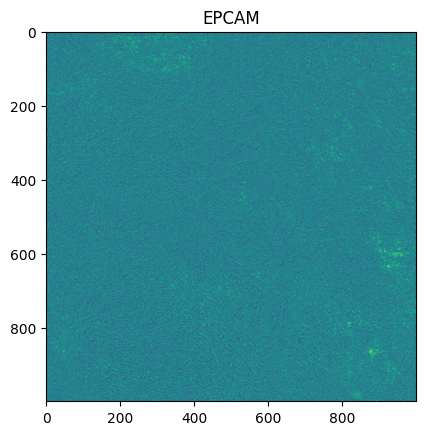

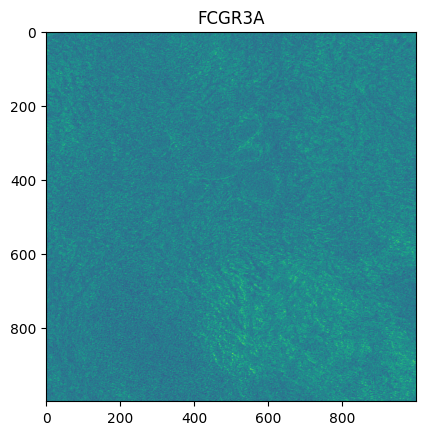

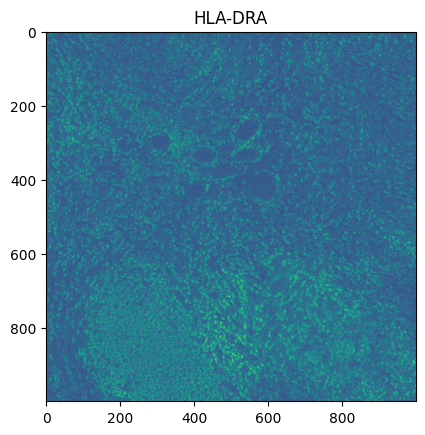

...

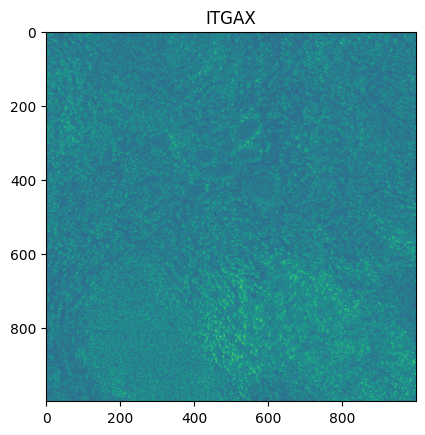

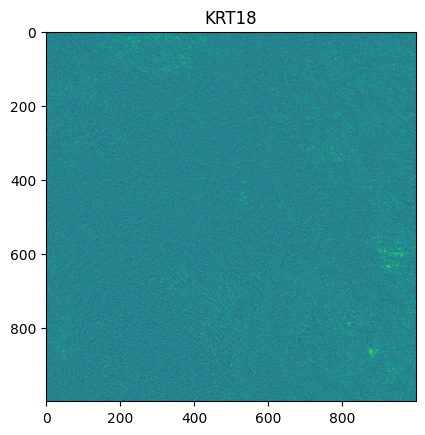

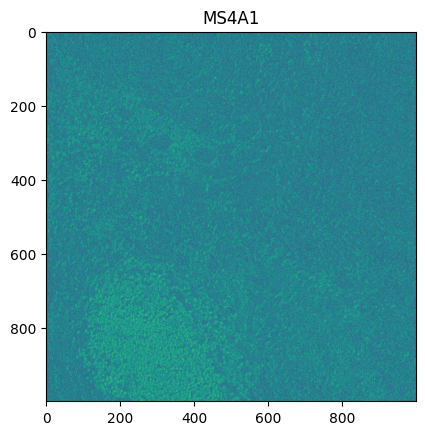

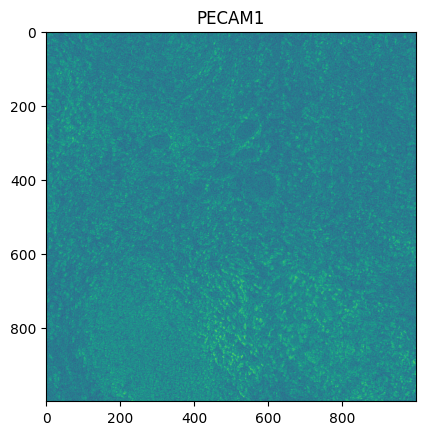

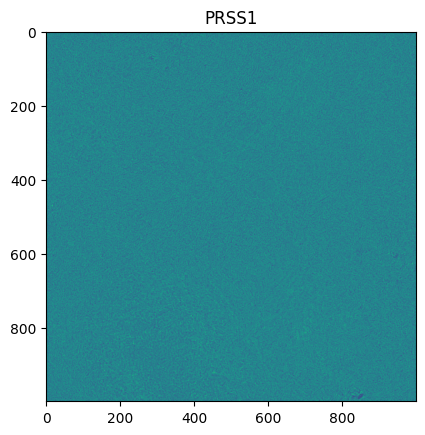

In [84]:
# cr1, cr2 = 3500, 4500
# cc1, cc2 = 4000, 5000
cr1, cr2 = 2500, 3500
cc1, cc2 = 3000, 4000
for i, g in enumerate(show_genes):
    plt.imshow(key_to_retiled['exp'][cr1:cr2, cc1:cc2, i])
    plt.title(g)
    plt.show()

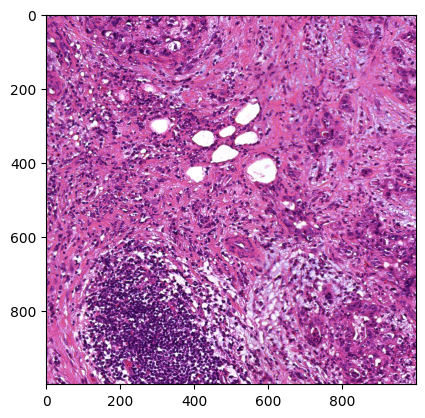

In [85]:
plt.imshow(he[cr1:cr2, cc1:cc2])

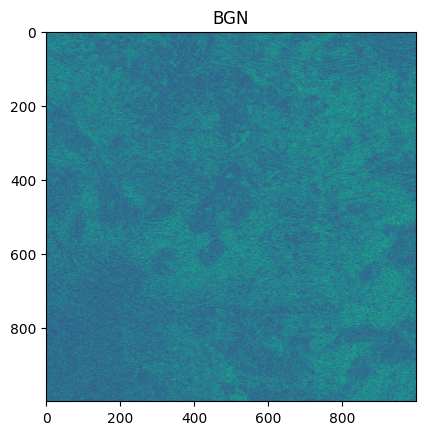

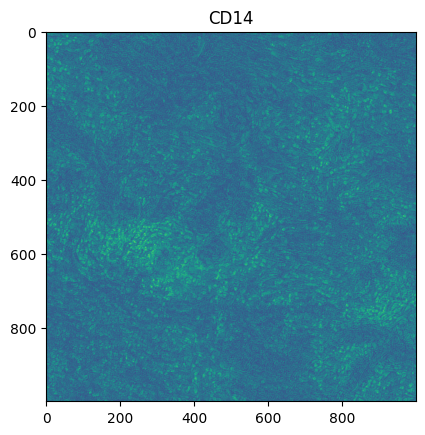

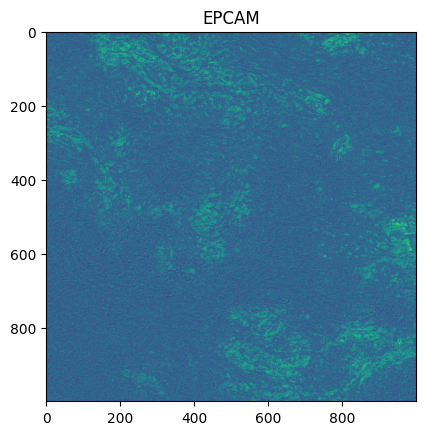

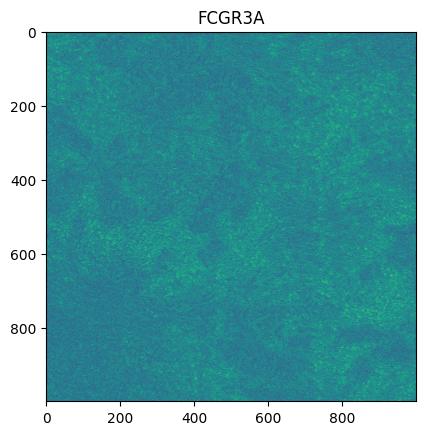

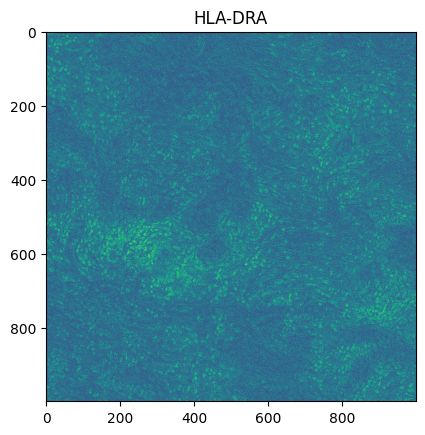

...

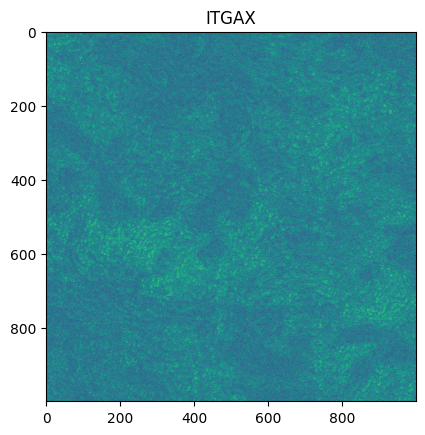

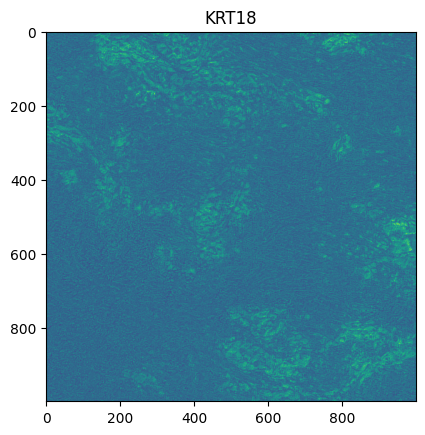

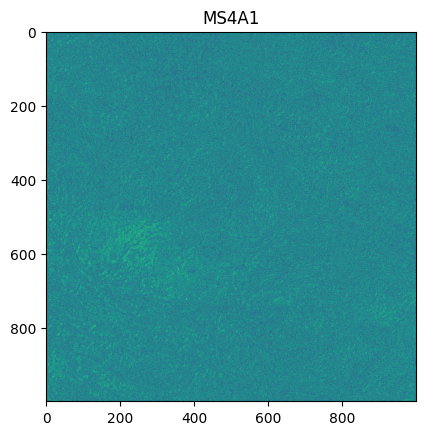

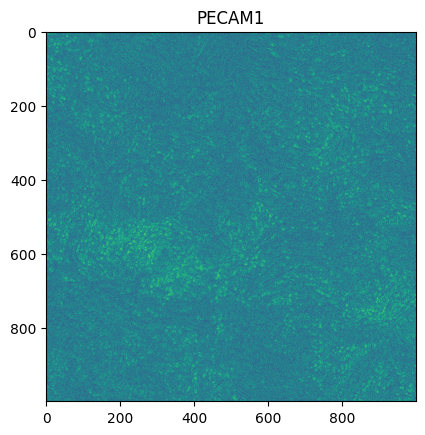

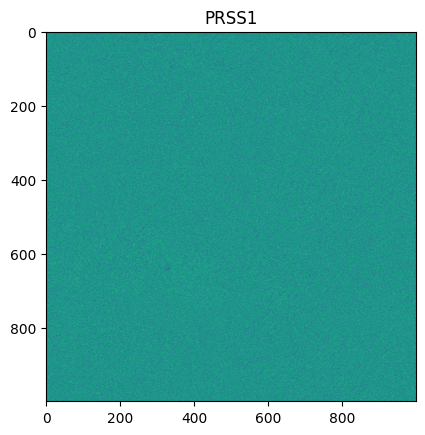

In [88]:
cr1, cr2 = 1500, 2500
cc1, cc2 = 6000, 7000
for i, g in enumerate(show_genes):
    plt.imshow(key_to_retiled['exp'][cr1:cr2, cc1:cc2, i])
    plt.title(g)
    plt.show()

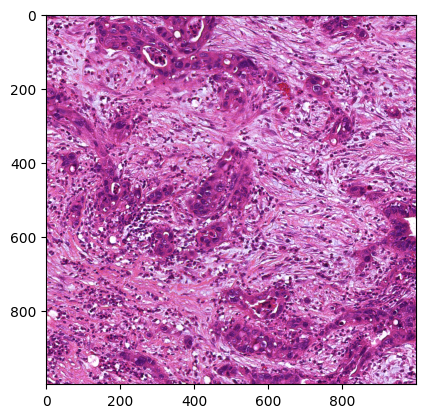

In [89]:
plt.imshow(he[cr1:cr2, cc1:cc2])

In [ ]:
spot_mask = a.uns['rescaled_spot_masks']['2X_trimmed']
spot_mask

In [ ]:
plt.imshow(spot_mask[cr1:cr2, cc1:cc2]>0)

In [ ]:
key_to_retiled['exp'].max()

In [66]:
## save gene expression image
exp = TF.convert_image_dtype(key_to_retiled['exp'], torch.uint8)
exp.shape

torch.Size([7513, 7200, 12])

In [67]:
torch.save(exp, f'../data/annotations/pdac/{s}_exp.pt')

In [68]:
## save gene expression image
meta = TF.convert_image_dtype(key_to_retiled['metagene_activity'], torch.uint8)
meta.shape

torch.Size([7513, 7200, 10])

In [69]:
torch.save(meta, f'../data/annotations/pdac/{s}_meta.pt')

In [70]:
a.uns['2X_trimmed_exp_prediction'] = exp.numpy()
a.uns['2X_trimmed_meta_prediction'] = meta.numpy()
a.uns['genes'] = show_genes
a.write_h5ad(f'../data/annotations/pdac/{s}.h5ad')

In [71]:
s

'HT416P1-S1H1A1U1'

In [ ]:
import seaborn as sns
metagenes = model.autokl.metagenes.detach().cpu().numpy()
metagenes = pd.DataFrame(data=metagenes, columns=model.autokl.genes, index=np.arange(metagenes.shape[0]))
metagenes = metagenes.loc[:, show_genes]
sns.clustermap(data=metagenes)

#### apply directly to H&E